In [1]:
# Some standard definitions and some new:
import numpy as np
import matplotlib.pyplot as plt
import astropy.io.fits as fits
from astropy.time import Time
import pylab
import glob
import time
import scipy.signal
import matplotlib.cm as cm
from astropy.stats import sigma_clip
import scipy.ndimage.interpolation as interp
from scipy.ndimage.interpolation import shift
import astropy
from astropy.stats import LombScargle
from photutils import DAOStarFinder
import os
import pandas as pd
from collections import Counter

%matplotlib inline

In [2]:
targ_names = {'Upper_Left_Quad rel_flux_T1':"V819 Tau",
             'Upper_Left_Quad rel_flux_T2':"FR Tau",
             'Upper_Left_Quad rel_flux_T3':"FQ Tau",
             'Upper_Right_Quad rel_flux_T1':"V410 X-ray 3",
             'Upper_Right_Quad rel_flux_T2':"V410 X-ray 1",
             'Lower_Left_Quad rel_flux_T1':"V410 X-ray 6",
             'Lower_Right_Quad rel_flux_T1':"CoKu Tau",
             'Lower_Right_Quad rel_flux_T2':"V892 Tau",
             'Lower_Right_Quad rel_flux_T3':"CZ Tau",
             'Lower_Right_Quad rel_flux_T4':"DD Tau",
             'Lower_Right_Quad rel_flux_T5':"KPNO 10",
             'HH_30 rel_flux_T1' :"HH 30",
             'HL_Tau rel_flux_T1' : "HL Tau",
             'LkHa_267 rel_flux_T1': "LkHa 267",
             'LkHa_358 rel_flux_T1' : "LkHa 358",
             'Other_UX_Tau rel_flux_T1': "UX Tau B",
             'UX_Tau_A_or_B rel_flux_T1': "UX Tau A",
             'XZ_Tau rel_flux_T1' : "XZ Tau"}
targ_err_names = {'Upper_Left_Quad rel_flux_err_T1':"V819 Tau",
             'Upper_Left_Quad rel_flux_err_T2':"FR Tau",
             'Upper_Left_Quad rel_flux_err_T3':"FQ Tau",
             'Upper_Right_Quad rel_flux_err_T1':"V410 X-ray 3",
             'Upper_Right_Quad rel_flux_err_T2':"V410 X-ray 1",
             'Lower_Left_Quad rel_flux_err_T1':"V410 X-ray 6",
             'Lower_Right_Quad rel_flux_err_T1':"CoKu Tau",
             'Lower_Right_Quad rel_flux_err_T2':"V892 Tau",
             'Lower_Right_Quad rel_flux_err_T3':"CZ Tau",
             'Lower_Right_Quad rel_flux_err_T4':"DD Tau",
             'Lower_Right_Quad rel_flux_err_T5':"KPNO 10",
             'HH_30 rel_flux_err_T1' :"HH 30",
             'HL_Tau rel_flux_err_T1' : "HL Tau",
             'LkHa_267 rel_flux_err_T1': "LkHa 267",
             'LkHa_358 rel_flux_err_T1' : "LkHa 358",
             'Other_UX_Tau rel_flux_err_T1': "UX Tau B",
             'UX_Tau_A_or_B rel_flux_err_T1': "UX Tau A",
             'XZ_Tau rel_flux_err_T1' : "XZ Tau"}
targ_mass = {'KPNO 10':[0.117],
            'DD Tau':[0.245],
            'CZ Tau':[0.177],
            'V892 Tau':['NaN'],
            'V410 X-ray 6':[0.088],
            'CoKu Tau':[0.558],
            'V410 X-ray 3':[0.058],
            'V819 Tau':[0.637],
            'FR Tau':[0.101],
            'V410 X-ray 1':[0.222],
            'FQ Tau':[0.245],
            'XZ Tau':[0.359],
            'HL Tau':[0.649],
            'LkHa 267':[0.398],
            'UX Tau A':[0.82],
            'UX Tau B':[0.359],
            'LkHa 358':[0.637],
            'HH 30':[0.558]}
names_of_targs = list(targ_names.values())

In [3]:
nyq = 500 #nyquist factor for Lomb-Scargle
min_freq = 0.25 #minimum frequency for Lomb-Scargle
max_freq = 20

window = 0.25

/Users/mirandaeiben/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


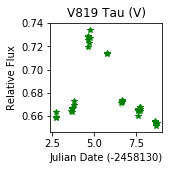

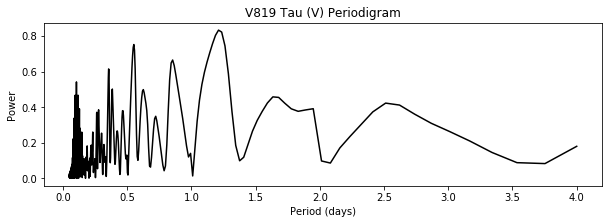

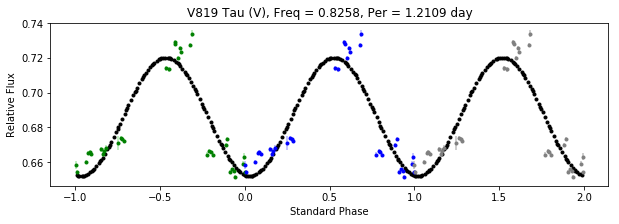

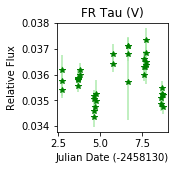

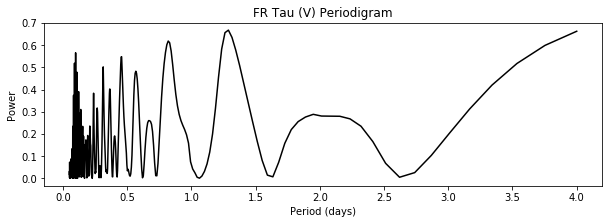

...

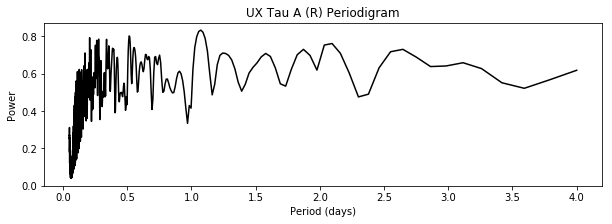

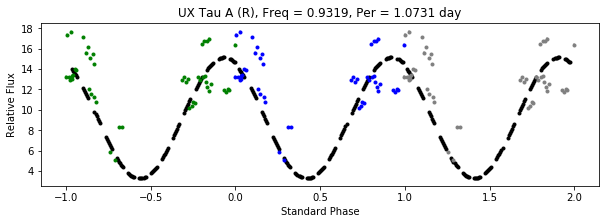

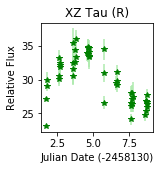

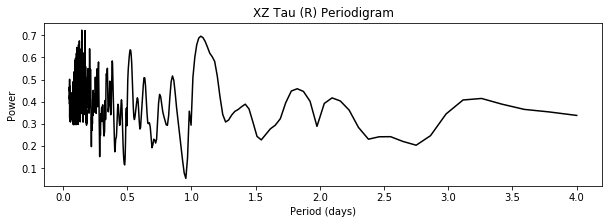

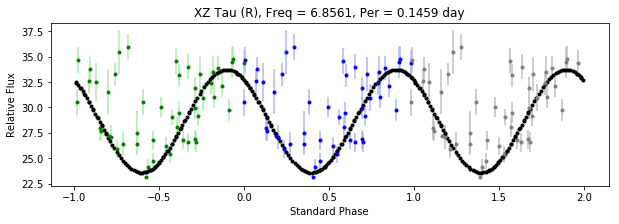

In [4]:
direct = os.getcwd() #getting current directory

filters = ['V','I','R'] #all filters

all_targ_data_d = {} #setting up dictionaries for data/emptying previous dictionaries
all_targ_err_d = {}
period_data_d = {}
time_data_d = {}
for ind,filt in enumerate(filters):
    data_dir = direct+'/Data/'+filt+'_Combined/' #getting specific filter

    #Assuming the code is at top and files with diff photometry data are under data, then in filer_Combined
        #Base_directory/Data/Filter_Combined
        #EX: MirSD/Data/I_Combined
        
    files = glob.glob(data_dir+'*.csv') #grabbing files with data

    pot_bad_frames = []
    for t_ind in range(len(files)):
        data = pd.read_csv(files[t_ind]) #reading in files to data frame
        jd_time_24e5 = (data.JD_UTC-2458130) #time of observations, subtracting the base number to avoid annoyance
        
        targ = data.filter(regex='rel_flux_T') #creating new dataframe with all the targets in the data frame
        targ_err = data.filter(regex='rel_flux_err_T') #creating new dataframe with all the target errors in the data frame
        comp = data.filter(regex='rel_flux_C') #creating new dataframe with all the comparison stars in the data frame
        comp_err = data.filter(regex='rel_flux_err_C') #creating new dataframe with all the comparison stars errors in the data frame
        
        #CHANGE IF DIFFERNT FILE STRUCTURE
        cut = 'Combined/' #grabbing quadrant of data from data titles
        shortname = files[t_ind].split(cut)
        cut = '_'+filt+'.csv'
        shortname1 = shortname[1].split(cut)
    
        temp_col_name = [] #setting up temp lists for names
        temp_col_err = []
        new_col_name = []
        new_col_err = []
        for ind in range(0,len(targ.columns)): #indexed over all the targets
            test_targ_n = targ.iloc[:,ind] #the singular target
            test_targ_err_n = targ_err.iloc[:,ind] #and it's error
            
            for aa in range(0,len(test_targ_n)): #testing for bad pictures
                if test_targ_err_n[aa]>(2*np.average(test_targ_err_n)):
                    pot_bad_frames.append(data.Label[aa]) #storing potentially bad frames
                    test_targ_n[aa] = 'NaN' #replacing bad points with nans
                    test_targ_err_n[aa] = 'NaN'
            
            #making a new plot for light curve
            fig, ax = plt.subplots(figsize=(2,2)) #making a new plot for light curve
            plt.errorbar(jd_time_24e5, targ.iloc[:,ind], targ_err.iloc[:,ind], fmt='*', color='green', ecolor='#adebad') #plot one targ
            plt.ylabel('Relative Flux')
            plt.xlabel('Julian Date (-2458130)')
            
            #making a new name for the column w/ quadrant
            temp_col_name.append(shortname1[0]+' '+targ.columns[ind]) 
            temp_col_err.append(shortname1[0]+' '+targ_err.columns[ind]) #and also it's error
            new_col_name.append(targ_names[temp_col_name[ind]])
            new_col_err.append(targ_err_names[temp_col_err[ind]])
            plt.title(new_col_name[ind]+' ('+filt+')')
            
            #if filt=='I':
                #plt.savefig(new_col_name[ind]+' ('+filt+')'+'.png')
            
            #getting rid of nans before LombScargle
            test_targ = test_targ_n[-np.isnan(test_targ_n)] 
            test_targ_err = test_targ_err_n[-np.isnan(test_targ_err_n)]
            time = jd_time_24e5[-np.isnan(test_targ_n)]
            
            #Lomb-Scargle
            lmscgl = LombScargle(time, test_targ, test_targ_err) #setting up a LombScargle periodigram
            frequency, power = lmscgl.autopower(nyquist_factor=nyq, minimum_frequency = min_freq, maximum_frequency = max_freq, samples_per_peak=10) #getting freq and power data
            #frequency, power = lmscgl.autopower() #getting freq and power data
            period_days = 1./frequency #period in days
            
            fig, ax = plt.subplots(figsize=(10,3)) #setting up a new plot
            plt.plot(period_days,power,'k')
            plt.ylabel('Power')
            plt.xlabel('Period (days)')
            plt.title(new_col_name[ind]+' ('+filt+') Periodigram')
            
            best_frequency = frequency[np.argmax(power)] 
            best_period = period_days[np.argmax(power)] # units are still in days...
            
            #if abs(1-best_period)<=window:
            #    period_test = period_days
            #    w = np.where(np.logical_and(period_test>=(1-window), period_test<=(1+window)))
            #    n_power = np.delete(power,w)
            #    best_period = period_test[np.argmax(n_power)]
            #if best_period==(1/min_freq):
            #    period_test = period_days
            #    w = np.where(np.logical_and(period_test>=((1/min_freq)-window), period_test<=((1/min_freq))))
            #    n_power = np.delete(power,w)
            #    best_period = period_test[np.argmax(n_power)]
            
#TO CHANGE TIME EPOCH LOOK HERE
            time_ep = time[2] #time epoch to test phase against CHANGE
            phase_data = ((time-time_ep)/best_period) #phase
            stnd_phase_data = phase_data%1 #normalized phase
                
            time_model = np.linspace(np.min(time), np.max(time), 100) #a model of the time
            mag_model = LombScargle(time, test_targ, test_targ_err).model(time_model, best_frequency) #model of the best period
            phase_LS = ((time_model-time_ep)/best_period) #phase from the model
            stnd_phase_LS = phase_LS%1 #normalized phase from the model
            
            #making a new plot for periodigram
            fig, ax = plt.subplots(figsize=(10,3)) #setting up a new plot
            plt.plot(stnd_phase_LS, mag_model, 'k.') #plot the model normal phase
            plt.plot(stnd_phase_LS+-np.max(stnd_phase_LS), mag_model, 'k.') #as well as model +phase
            plt.plot(stnd_phase_LS+np.max(stnd_phase_LS), mag_model, 'k.') #and model -phase
               
            plt.errorbar(stnd_phase_data + -np.max(stnd_phase_data), test_targ, test_targ_err, fmt='.', color='green', ecolor='#adebad') #-phase data
            plt.errorbar(stnd_phase_data + 0, test_targ, test_targ_err, fmt='.', color='blue', ecolor='#b3b3ff') #normal phase data
            plt.errorbar(stnd_phase_data + np.max(stnd_phase_data), test_targ, test_targ_err, fmt='.', color='gray', ecolor='0.75') #+phase data
               
            plt.xlabel('Standard Phase')
            plt.ylabel('Relative Flux')
            plt.title(new_col_name[ind]+' ('+filt+')'+', '+'Freq = '+str(round(best_frequency,4))+', Per = '+str(round(best_period,4))+' day')
            #plt.savefig(new_col_name[ind]+'_'+filt+'_'+'Freq_'+str(round(best_frequency,4))+'Per_'+str(round(best_period,4))+'.pdf')
            
            target_stuff = np.vstack([targ.iloc[:,ind].values[:], np.array(jd_time_24e5)])
            
            #setting up temp dictionaries with data
            targ_data = {(new_col_name[ind],filt):target_stuff} #targ data dict
            targ_err_data = {(new_col_name[ind],filt):targ_err.iloc[:,ind].values[:]} #targ err dict
            period_data = {(new_col_name[ind],filt):best_period} #best periods for all bands/stars
            
            #updating overall dictionaries with new data
            all_targ_data_d.update(targ_data) #all targ data dict
            all_targ_err_d.update(targ_err_data) #all targ err dict
            period_data_d.update(period_data) #all period data
        
#saving dictionaries to Series DataFrame
all_targ_data = pd.Series(all_targ_data_d)
all_targ_data_err = pd.Series(all_targ_err_d)
all_per_data = pd.Series(period_data_d)


# Hierarchical calling for the all targ, all filt dataframes
1) Just the name will call everything with that name. Includes flux data (first row) and time data (second row) <p>
    <pre><i>Ex: all_targ_data['FR Tau'] gets you all the filters of FR Tau</i></pre> <p>
2) Getting everything in a filter requires a colon. <p>
    <pre><i>Ex: all_targ_data[:,'V'] gets you all the targets' V data</i></pre> <p>
3) Want the specific filter in a specific target? Combine the two. <p>
    <pre><i>Ex: all_targ_data['FR Tau','V'] gets FR Tau's V band data in an array</i></pre> <p>
4) Flux data is the first row, so call with [0] <p>
    <pre><i>Ex: all_targ_data['FR Tau','V'][0] gets you just the flux data for FR Tau in V</i></pre> <p>
5) Time for data is the second row, so call with [1] <p>
    <pre><i>Ex: all_targ_data['FR Tau','V'][1] gets you just the time data for FR Tau in V</i></pre> <p>
    
## Nice Documentation:

https://jakevdp.github.io/PythonDataScienceHandbook/03.05-hierarchical-indexing.html

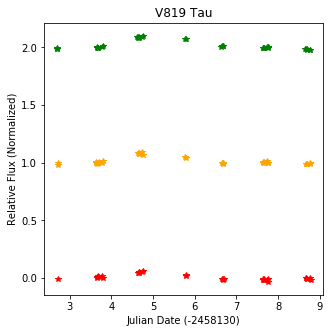

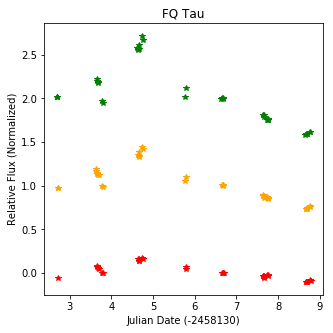

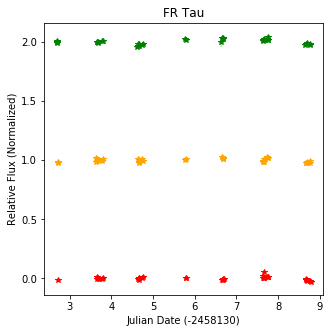

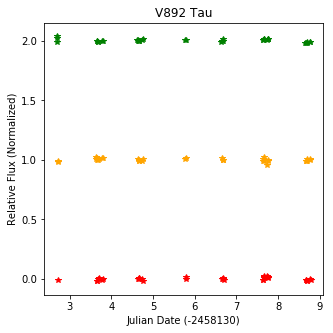

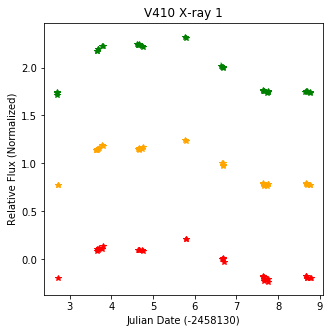

...

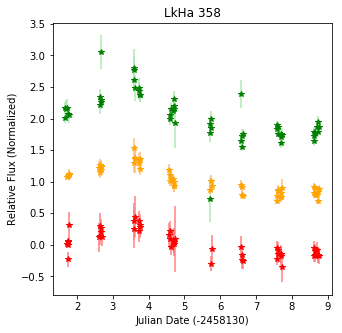

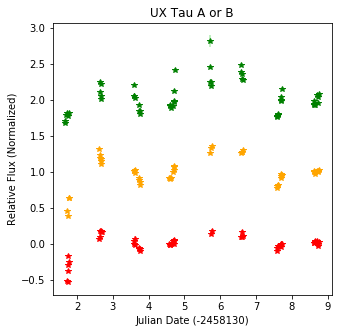

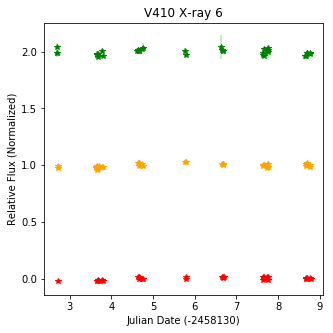

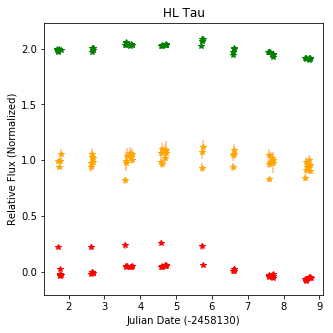

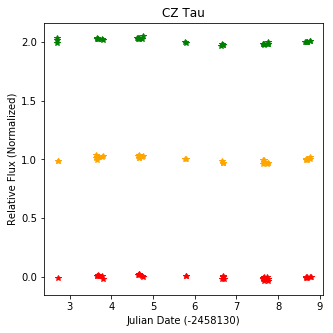

In [31]:
for ind in range(0,len(all_targ_data[:,'V'])):
    try:
        s_targ = names_of_targs[ind]
        v_norm = (all_targ_data[s_targ,'V'][0])/np.nanmedian(all_targ_data[s_targ,'V'][0])
        v_nerr = v_norm*(all_targ_data_err[s_targ,'V']/np.nanmedian(all_targ_data[s_targ,'V'][0]))
        i_norm = (all_targ_data[s_targ,'I'][0])/np.nanmedian(all_targ_data[s_targ,'I'][0])
        i_nerr = i_norm*(all_targ_data_err[s_targ,'I']/np.nanmedian(all_targ_data[s_targ,'I'][0]))
        r_norm = (all_targ_data[s_targ,'R'][0])/np.nanmedian(all_targ_data[s_targ,'R'][0])
        r_nerr = r_norm*(all_targ_data_err[s_targ,'R']/np.nanmedian(all_targ_data[s_targ,'R'][0]))
        fig, ax = plt.subplots(figsize=(5,5)) #making a new plot
        plt.errorbar(all_targ_data[s_targ,'V'][1], v_norm+1, v_nerr, fmt='*', color='green', ecolor='#adebad') #plot one targ
        plt.errorbar(all_targ_data[s_targ,'I'][1], i_norm-1, i_nerr, fmt='*', color='red', ecolor='#ff8080') #plot one targ
        plt.errorbar(all_targ_data[s_targ,'R'][1], r_norm, r_nerr, fmt='*', color='orange', ecolor='#ffbf80') #plot one targ
        plt.ylabel('Relative Flux (Normalized)')
        plt.xlabel('Julian Date (-2458130)')
        plt.title(s_targ)
    except:
        pass

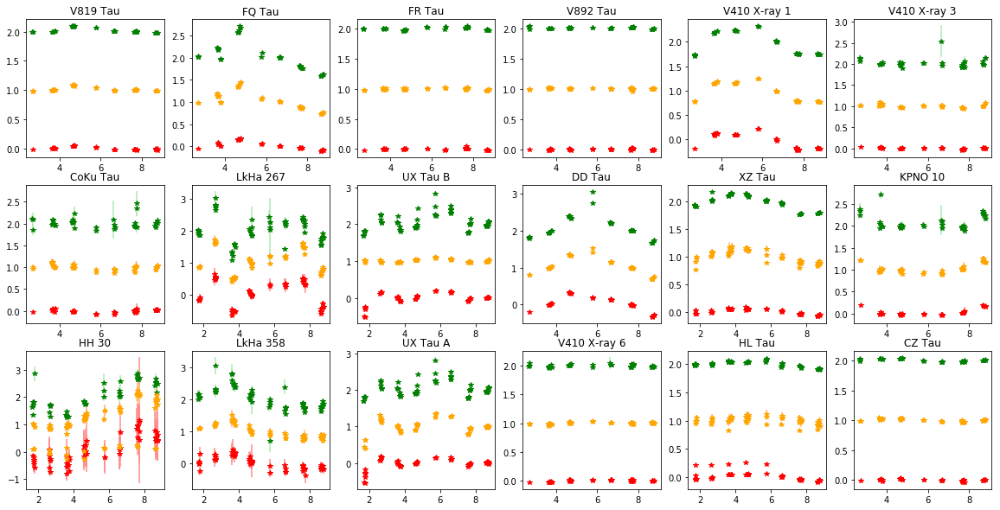

In [12]:
fig, ax = plt.subplots(nrows = 3, ncols = 6, figsize=(20,10)) #making a new plot

for ind in range(0,len(all_targ_data[:,'V'])):
    try:
        s_targ = names_of_targs[ind]
        v_norm = (all_targ_data[s_targ,'V'][0])/np.nanmedian(all_targ_data[s_targ,'V'][0])
        v_nerr = v_norm*(all_targ_data_err[s_targ,'V']/np.nanmedian(all_targ_data[s_targ,'V'][0]))
        i_norm = (all_targ_data[s_targ,'I'][0])/np.nanmedian(all_targ_data[s_targ,'I'][0])
        i_nerr = i_norm*(all_targ_data_err[s_targ,'I']/np.nanmedian(all_targ_data[s_targ,'I'][0]))
        r_norm = (all_targ_data[s_targ,'R'][0])/np.nanmedian(all_targ_data[s_targ,'R'][0])
        r_nerr = r_norm*(all_targ_data_err[s_targ,'R']/np.nanmedian(all_targ_data[s_targ,'R'][0]))
        if ind<=5:
            row = 0
            column = ind
        elif 5<ind<=11:
            row = 1
            column = ind-(6)
        else:
            row = 2
            column = ind-(12)
        ax[row,column].errorbar(all_targ_data[s_targ,'V'][1], v_norm+1, v_nerr, fmt='*', color='green', ecolor='#adebad') #plot one targ
        ax[row,column].errorbar(all_targ_data[s_targ,'I'][1], i_norm-1, i_nerr, fmt='*', color='red', ecolor='#FF8D8B') #plot one targ
        ax[row,column].errorbar(all_targ_data[s_targ,'R'][1], r_norm, r_nerr, fmt='*', color='orange', ecolor='#ffbf80') #plot one targ
        ax[row,column].set_title(s_targ)
        
    except:
        pass


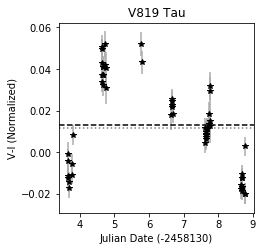

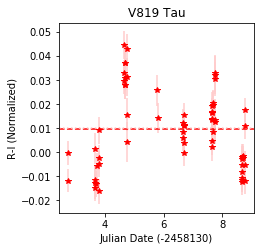

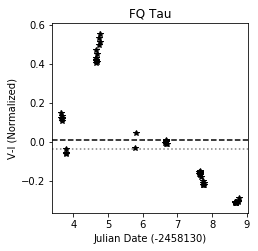

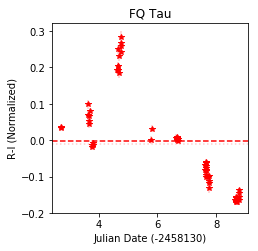

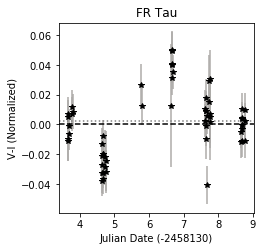

...

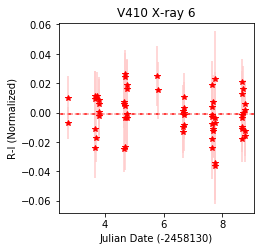

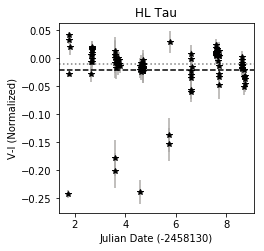

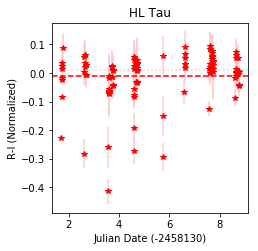

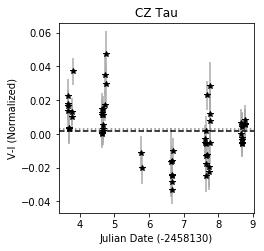

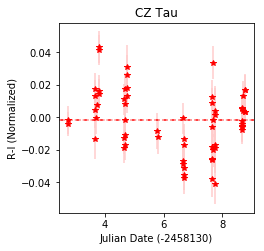

In [53]:

for ind in range(0,len(all_targ_data[:,'V'])):

    target = names_of_targs[ind]
    v_data = all_targ_data[target,'V'][0]
    v_norm = v_data/np.nanmedian(v_data)
    v_time = all_targ_data[target,'V'][1]
    v_nerr = v_norm*(all_targ_data_err[target,'V']/np.nanmedian(all_targ_data[target,'V'][0]))
    
    i_data = all_targ_data[target,'I'][0]
    i_norm = i_data/np.nanmedian(i_data)
    i_time = all_targ_data[target,'I'][1]
    i_nerr = i_norm*(all_targ_data_err[target,'I']/np.nanmedian(all_targ_data[target,'I'][0]))
    
    r_data = all_targ_data[target,'R'][0]
    r_norm = r_data/np.nanmedian(r_data)
    r_time = all_targ_data[target,'R'][1]
    r_nerr = r_norm*(all_targ_data_err[target,'R']/np.nanmedian(all_targ_data[target,'R'][0]))
    
    VI_color = []
    RI_color = []
    VI_time = []
    RI_time = []
    VI_err = []
    RI_err = []
        
    for itim in range(0,len(i_time)):
        for vtim in range(0,len(v_time)):
            if np.abs(v_time[vtim] - i_time[itim]) < 0.015:
                #print(v_data[itim]-i_data[itim])
                VI_color.append(v_norm[vtim]-i_norm[itim])
                VI_time.append(i_time[itim])
                VI_err.append(np.sqrt(np.square(v_nerr[vtim])+np.square(i_nerr[itim])))
                
        for rtim in range(0,len(r_time)):
            if np.abs(r_time[rtim] - i_time[itim]) < 0.015:
                RI_color.append(r_norm[rtim]-i_norm[itim]) 
                RI_time.append(i_time[itim])
                RI_err.append(np.sqrt(np.square(r_nerr[rtim])+np.square(i_nerr[itim])))
    VI_mean = np.nanmean(VI_color)
    VI_med = np.nanmedian(VI_color)
    RI_mean = np.nanmean(RI_color)
    RI_med = np.nanmedian(RI_color)
    fig, ax = plt.subplots(figsize=(3.5,3.5)) #making a new plot
    plt.errorbar(VI_time,VI_color,VI_err, fmt='*', color='black', ecolor='#ADABA8')
    plt.axhline(y=VI_mean, color='black',linestyle='--')
    plt.axhline(y=VI_med, color='grey',linestyle=':')
    plt.ylabel('V-I (Normalized)')
    plt.xlabel('Julian Date (-2458130)')
    plt.title(target)
    plt.savefig(target+'VI.png')
    fig, ax = plt.subplots(figsize=(3.5,3.5)) #making a new plot
    plt.errorbar(RI_time,RI_color,RI_err, fmt='*', color='red', ecolor='#ffcccc')
    plt.axhline(y=RI_mean, color='red',linestyle='--')
    plt.axhline(y=RI_med, color='#ffcccc',linestyle=':')
    plt.ylabel('R-I (Normalized)')
    plt.xlabel('Julian Date (-2458130)')
    plt.title(target)
    plt.savefig(target+'RI.png')

UX Tau B the period of 0.5603041582904721


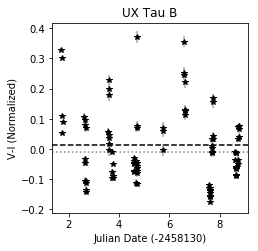

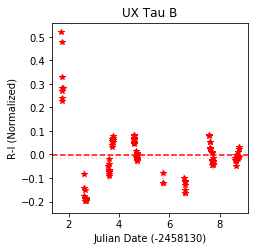

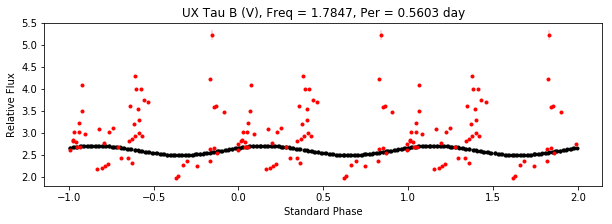

UX Tau B the period of 0.5603041582904721


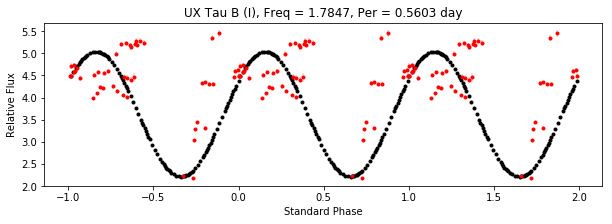

UX Tau B the period of 0.5603041582904721


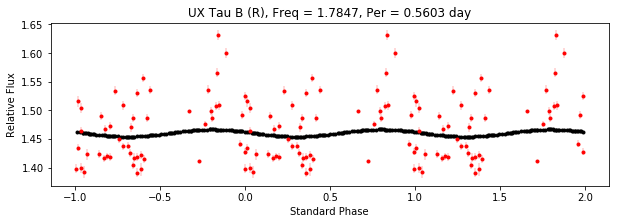

UX Tau B the period of 0.2629744854586897


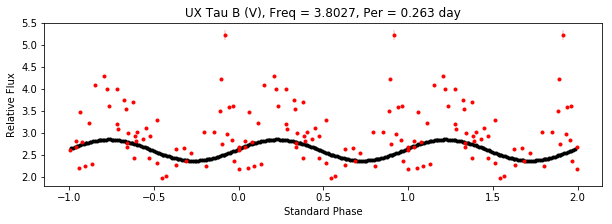

UX Tau B the period of 0.2629744854586897


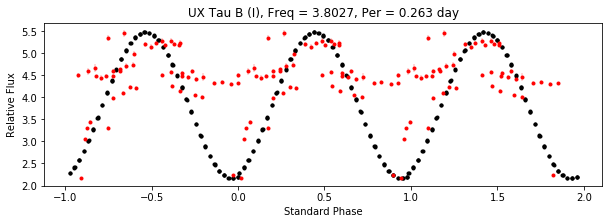

UX Tau B the period of 0.2629744854586897


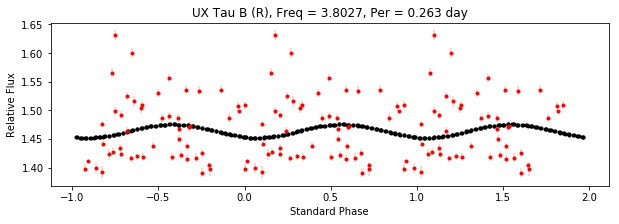

UX Tau B the period of 1.2658182308778414


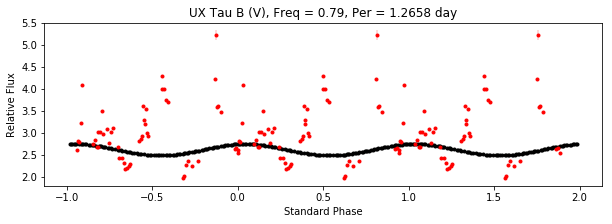

UX Tau B the period of 1.2658182308778414


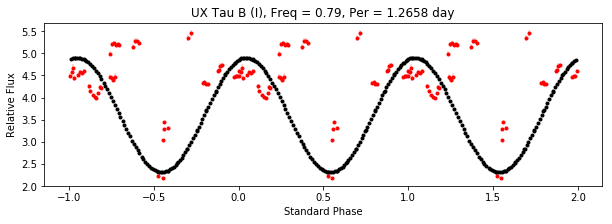

UX Tau B the period of 1.2658182308778414


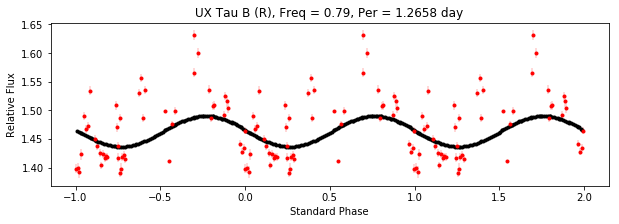

UX Tau B the period of 0.5515214452267677


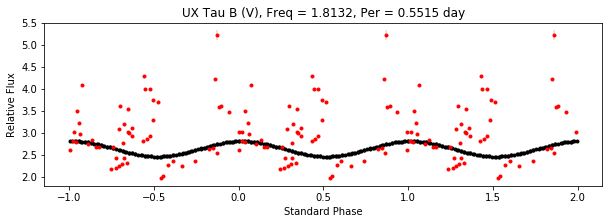

UX Tau B the period of 0.5515214452267677


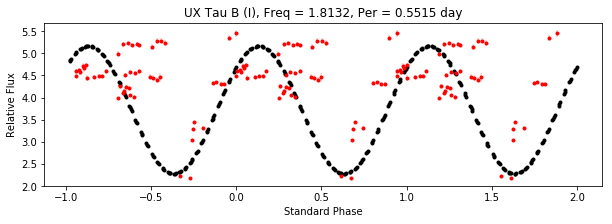

UX Tau B the period of 0.5515214452267677


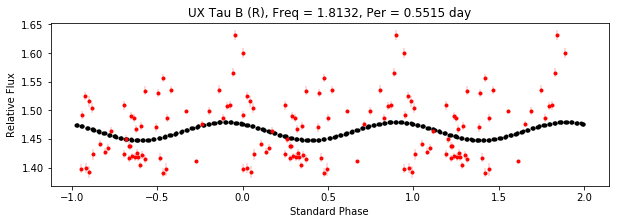

In [24]:

target = 'UX Tau B'
v_data = all_targ_data[target,'V'][0]
v_norm = v_data/np.nanmedian(v_data)
v_time = all_targ_data[target,'V'][1]
v_nerr = v_norm*(all_targ_data_err[target,'V']/np.nanmedian(all_targ_data[target,'V'][0]))

i_data = all_targ_data[target,'I'][0]
i_norm = i_data/np.nanmedian(i_data)
i_time = all_targ_data[target,'I'][1]
i_nerr = i_norm*(all_targ_data_err[target,'I']/np.nanmedian(all_targ_data[target,'I'][0]))

r_data = all_targ_data[target,'R'][0]
r_norm = r_data/np.nanmedian(r_data)
r_time = all_targ_data[target,'R'][1]
r_nerr = r_norm*(all_targ_data_err[target,'R']/np.nanmedian(all_targ_data[target,'R'][0]))

VI_color = []
RI_color = []
VI_time = []
RI_time = []
VI_err = []
RI_err = []

for itim in range(0,len(i_time)):
    for vtim in range(0,len(v_time)):
        if np.abs(v_time[vtim] - i_time[itim]) < 0.015:
            #print(v_data[itim]-i_data[itim])
            VI_color.append(v_norm[vtim]-i_norm[itim])
            VI_time.append(i_time[itim])
            VI_err.append(np.sqrt(np.square(v_nerr[vtim])+np.square(i_nerr[itim])))
                
    for rtim in range(0,len(r_time)):
        if np.abs(r_time[rtim] - i_time[itim]) < 0.015:
            RI_color.append(r_norm[rtim]-i_norm[itim]) 
            RI_time.append(i_time[itim])
            RI_err.append(np.sqrt(np.square(r_nerr[rtim])+np.square(i_nerr[itim])))
VI_mean = np.nanmean(VI_color)
VI_med = np.nanmedian(VI_color)
RI_mean = np.nanmean(RI_color)
RI_med = np.nanmedian(RI_color)
fig, ax = plt.subplots(figsize=(3.5,3.5)) #making a new plot
plt.errorbar(VI_time,VI_color,VI_err, fmt='*', color='black', ecolor='#ADABA8')
plt.axhline(y=VI_mean, color='black',linestyle='--')
plt.axhline(y=VI_med, color='grey',linestyle=':')
plt.ylabel('V-I (Normalized)')
plt.xlabel('Julian Date (-2458130)')
plt.title(target)

fig, ax = plt.subplots(figsize=(3.5,3.5)) #making a new plot
plt.errorbar(RI_time,RI_color,RI_err, fmt='*', color='red', ecolor='#ffcccc')
plt.axhline(y=RI_mean, color='red',linestyle='--')
plt.axhline(y=RI_med, color='#ffcccc',linestyle=':')
plt.ylabel('R-I (Normalized)')
plt.xlabel('Julian Date (-2458130)')
plt.title(target)

filters = ['V','I','R']
min_freq = 0.25
max_freq = 4
        
per_targ = [target] 

for ind in range(0,len(per_targ)): 
    best_per = np.zeros([3,5]) #generating empty best period array
    #making that best period array (contains each band)
    for filt in range(0,len(filters)): #looping through each filter
        time_n = np.array(RI_time) #time for each target
        starflux_n = np.array(RI_color) #star flux with nans
        starfluxerr_n = np.array(RI_err) #error with nans
        starflux = starflux_n[~np.isnan(starflux_n)] #starflux without nans
        starfluxerr = starfluxerr_n[~np.isnan(starfluxerr_n)] #starflux error without nans
        time = time_n[~np.isnan(starflux_n)] #time without nans
     
        f, p = LombScargle(time, starflux, starfluxerr).autopower(minimum_frequency = min_freq, maximum_frequency = max_freq) # default autopower settings
        
        # calculate the period, as inverse of frequency
        per = 1/f
        
        # make an array of the three columns and turn that into a dataframe:
        ls_output_arrays = np.c_[p, f, per]
        ls_output = pd.DataFrame(ls_output_arrays, columns=['Power', 'Frequency', 'Period'])
        
        # now sort the whole dataframe by the “Power” column and save the first 10 rows:
        best_per_df = ls_output.sort_values(by='Power', ascending=False)['Period']
        best_per[filt] = best_per_df[:5].values #saving the 10 strongest periods in this band
    #testing the best period
    for per in range(0,len(best_per[0])-1):
        for filt in range(0,len(filters)):
            test_per = best_per[filt][per] #looping through the V band periods
            print(per_targ[ind]+' the period of '+str(test_per)) #print common V band period
            #then model that period on all three bands
            time_n = all_targ_data[per_targ[ind],filters[filt]][1] #time for each target
            starflux_n = all_targ_data[per_targ[ind],filters[filt]][0] #star flux with nans
            starfluxerr_n = all_targ_data_err[per_targ[ind],filters[filt]] #error with nans
            starflux = starflux_n[~np.isnan(starflux_n)] #starflux without nans
            starfluxerr = starfluxerr_n[~np.isnan(starfluxerr_n)] #starflux error without nans
            time = time_n[~np.isnan(starflux_n)] #time without nans
                
            time_ep = time[2] #time epoch to test phase against CHANGE
            phase_data = ((time-time_ep)/test_per) #phase
            stnd_phase_data = phase_data%1 #normalized phase
                
            test_freq = 1/test_per
                
            time_model = np.linspace(np.min(time), np.max(time), 100) #a model of the time
            mag_model = LombScargle(time, starflux, starfluxerr).model(time_model, test_freq) #model of the best period
            phase_LS = ((time_model-time_ep)/test_per) #phase from the model
            stnd_phase_LS = phase_LS%1 #normalized phase from the model
            
            #making a new plot for periodigram
            fig, ax = plt.subplots(figsize=(10,3)) #setting up a new plot
            plt.plot(stnd_phase_LS, mag_model, 'k.') #plot the model normal phase
            plt.plot(stnd_phase_LS+-np.max(stnd_phase_LS), mag_model, 'k.') #as well as model +phase
            plt.plot(stnd_phase_LS+np.max(stnd_phase_LS), mag_model, 'k.') #and model -phase
                
            plt.errorbar(stnd_phase_data + -np.max(stnd_phase_data), starflux, starfluxerr, fmt='.', color='red', ecolor='#ffcccc') #-phase data
            plt.errorbar(stnd_phase_data + 0, starflux, starfluxerr, fmt='.', color='red', ecolor='#ffcccc') #normal phase data
            plt.errorbar(stnd_phase_data + np.max(stnd_phase_data), starflux, starfluxerr, fmt='.', color='red', ecolor='#ffcccc') #+phase data
                  
            plt.xlabel('Standard Phase')
            plt.ylabel('Relative Flux')
            plt.title(per_targ[ind]+' ('+filters[filt]+')'+', '+'Freq = '+str(round(test_freq,4))+', Per = '+str(round(test_per,4))+' day')
            plt.show()

In [25]:
starflux

array([1.498817, 1.508577, 1.397851, 1.536241, 1.565824, 1.530299,
       1.423401, 1.44181 , 1.411897, 1.438194, 1.39953 , 1.487181,
       1.631462, 1.557014, 1.415927, 1.427528, 1.47607 , 1.48649 ,
       1.391978, 1.50691 , 1.60035 , 1.486773, 1.419557, 1.434514,
       1.498253, 1.418608, 1.42341 , 1.508479, 1.534727, 1.418124,
       1.464502, 1.421769, 1.450393, 1.492508, 1.470726, 1.490044,
       1.414855, 1.436778, 1.524944, 1.4173  , 1.467147, 1.425051,
       1.515432, 1.391137, 1.472874, 1.403922, 1.504294, 1.396603,
       1.53462 ])

## COMPARE AMPLITUDES

KPNO 10 the period of 2.867657466349747


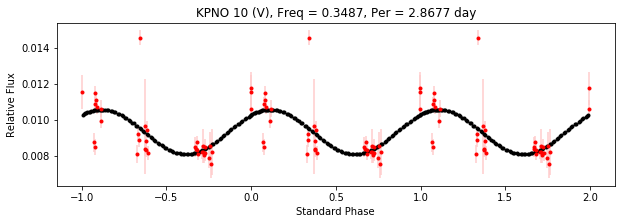

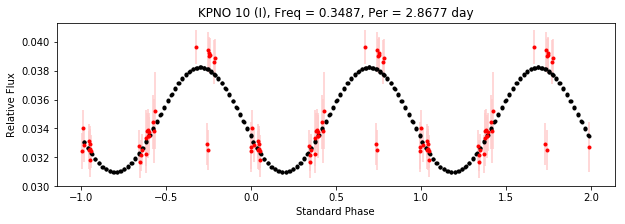

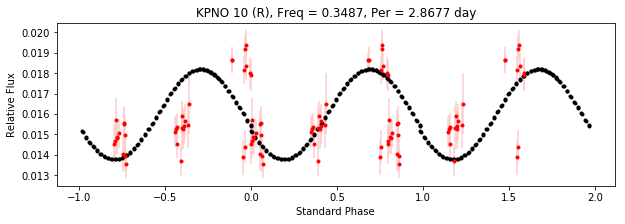

KPNO 10 the period of 1.5507079984296177


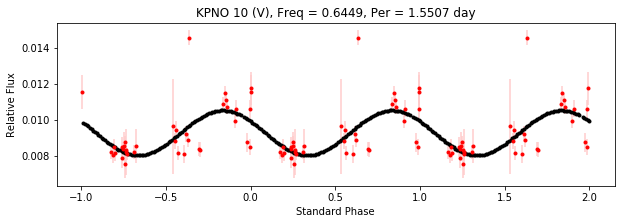

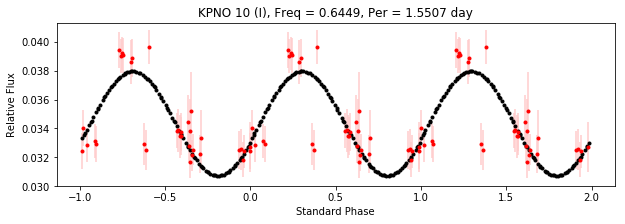

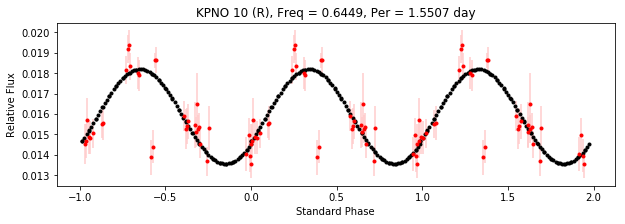

KPNO 10 the period of 0.8783871666742263


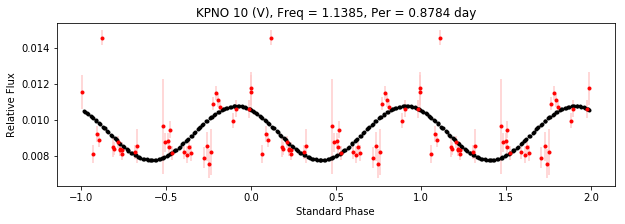

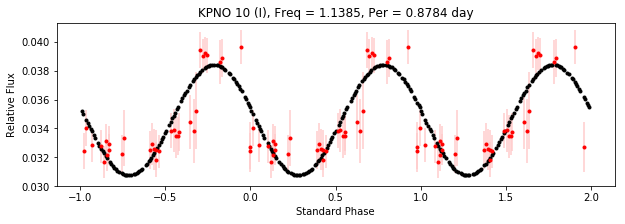

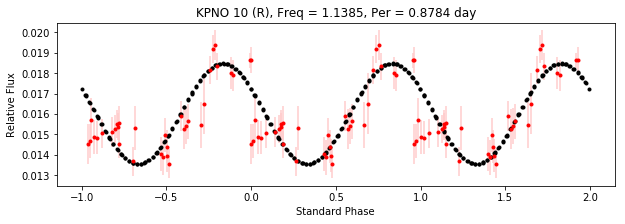

KPNO 10 the period of 1.4754217744483842


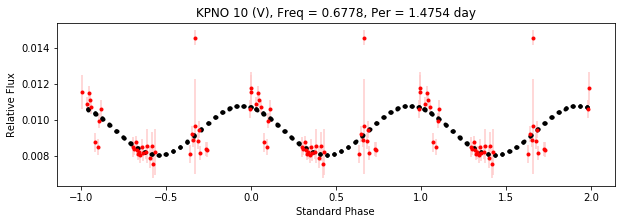

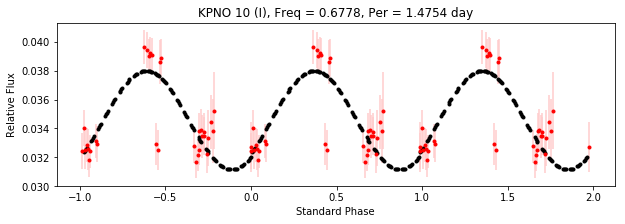

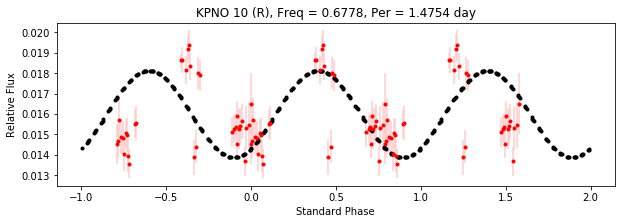

DD Tau the period of 1.1872253149373702


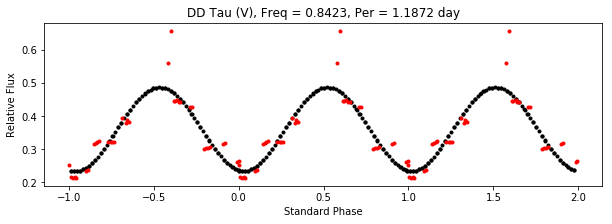

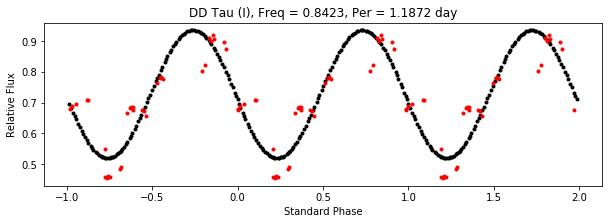

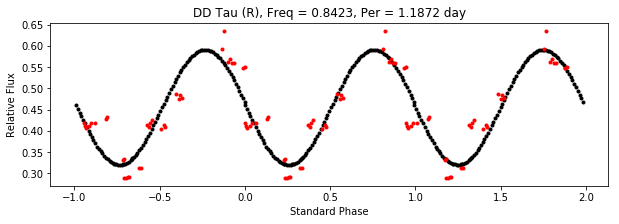

DD Tau the period of 1.1425885891190977


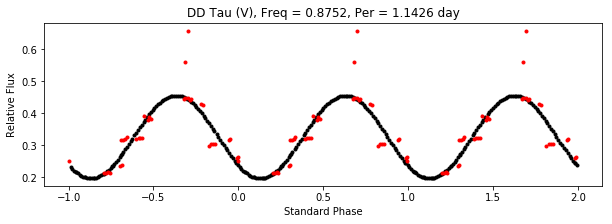

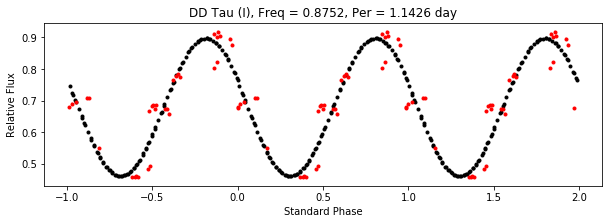

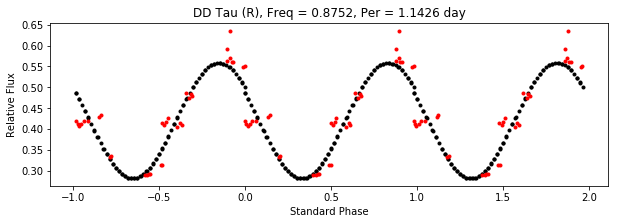

DD Tau the period of 0.8537116370251768


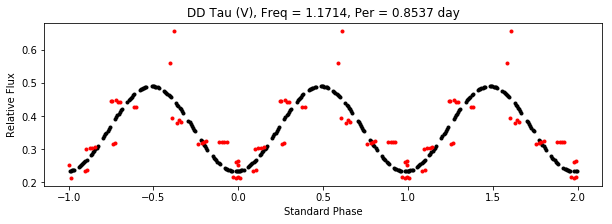

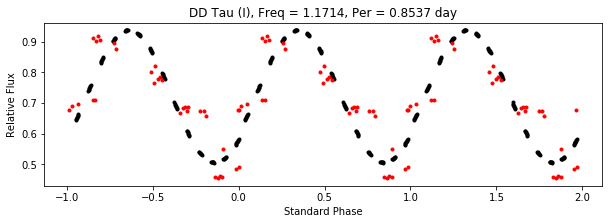

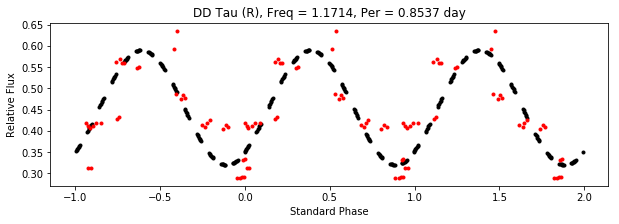

DD Tau the period of 0.8783871666742263


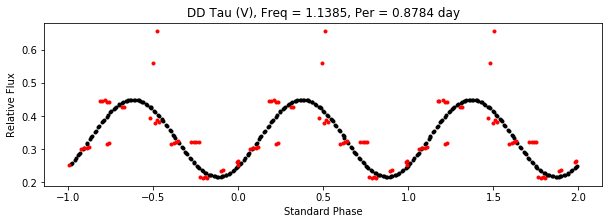

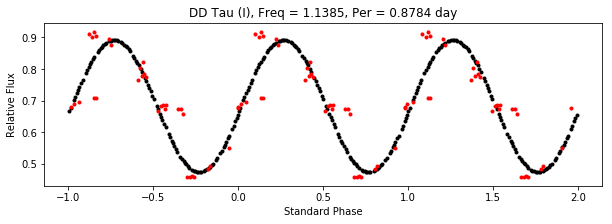

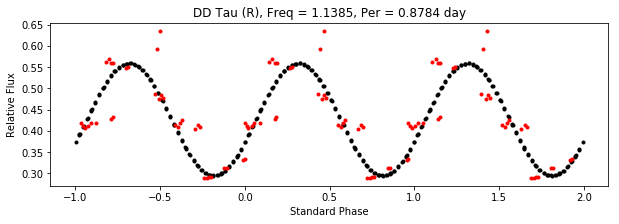

DD Tau the period of 1.1011867016607335


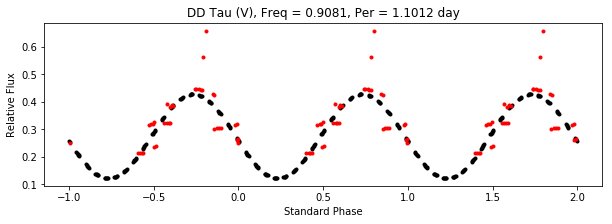

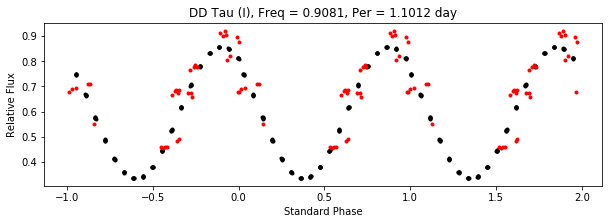

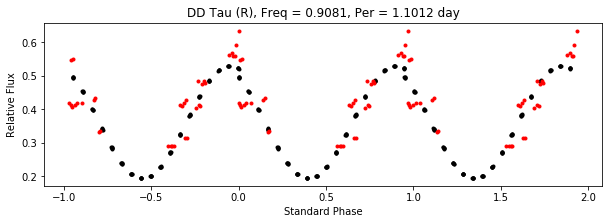

DD Tau the period of 0.9045315871424904


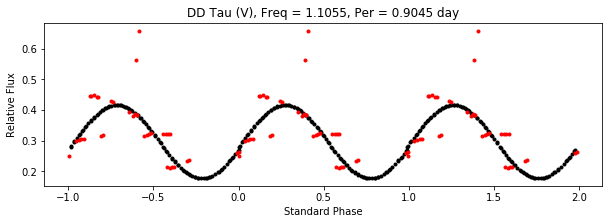

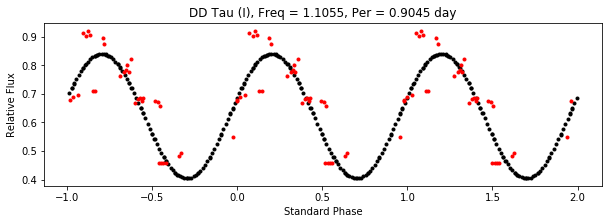

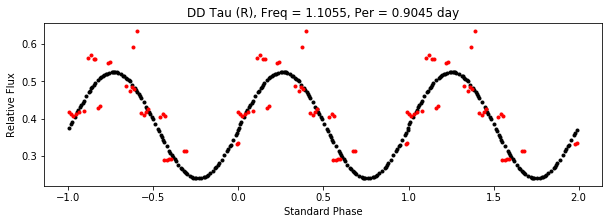

CZ Tau the period of 0.8537116370251768


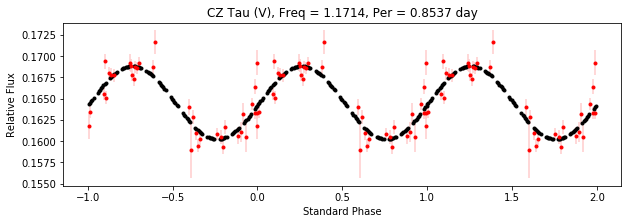

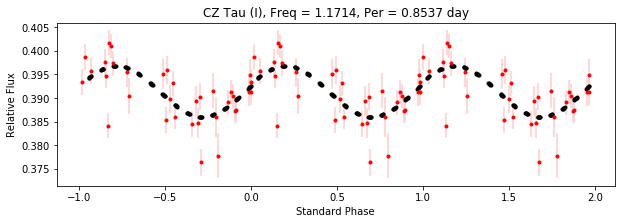

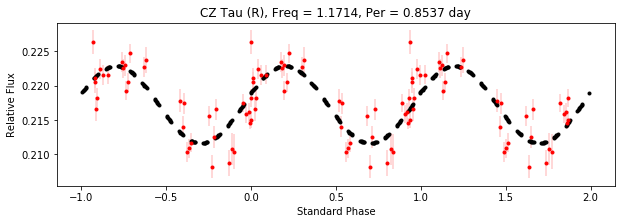

CZ Tau the period of 1.1872253149373702


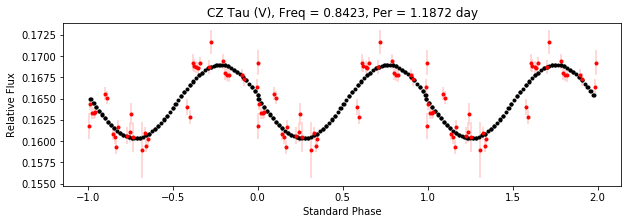

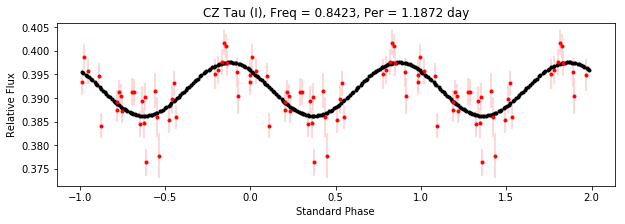

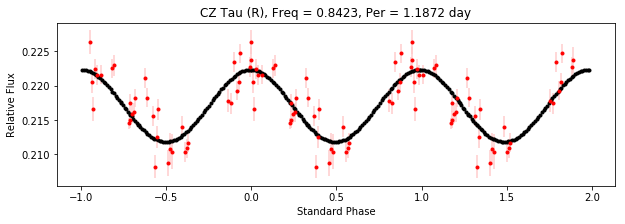

CZ Tau the period of 1.235491411693246


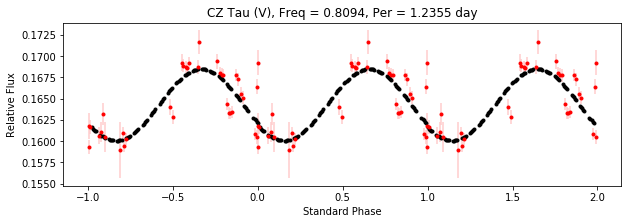

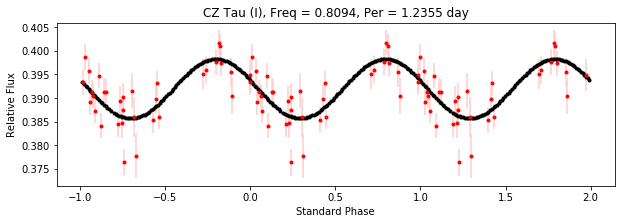

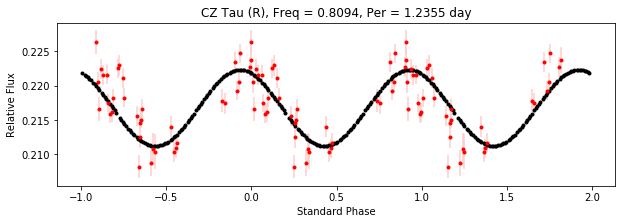

CoKu Tau the period of 0.3178953424392276


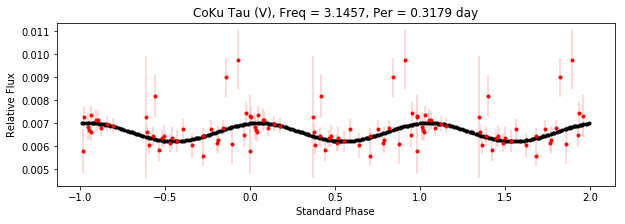

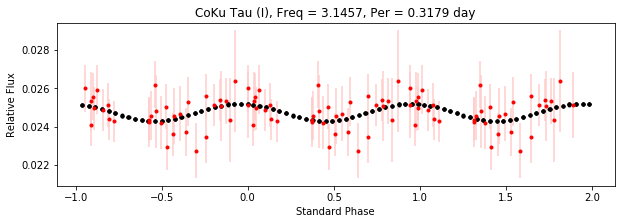

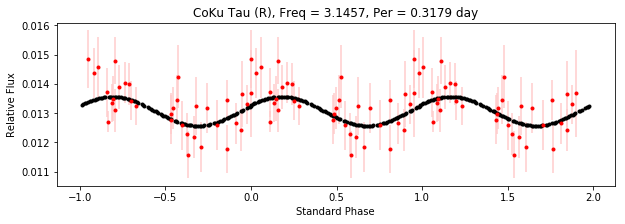

CoKu Tau the period of 0.8783871666742263


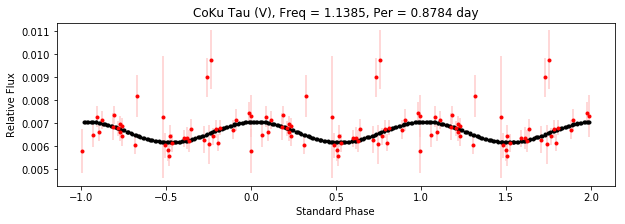

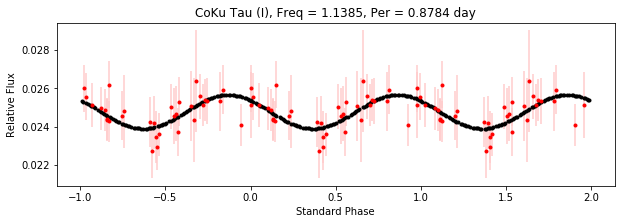

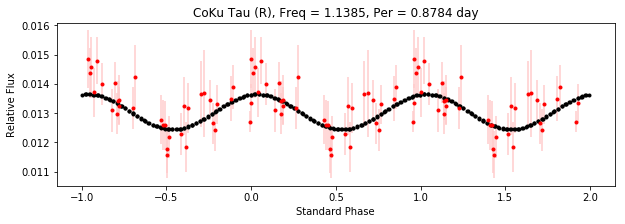

V410 X-ray 3 the period of 3.166449596221522


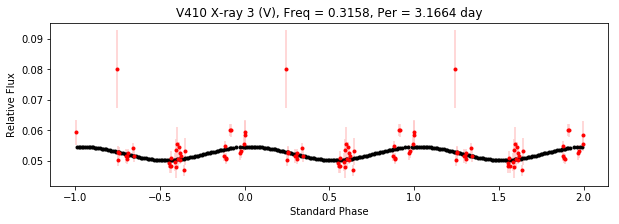

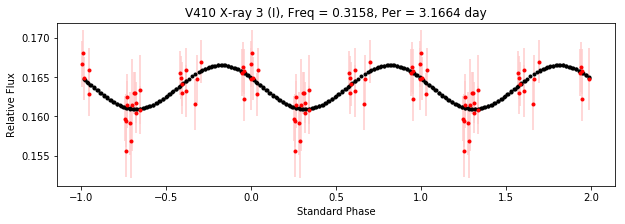

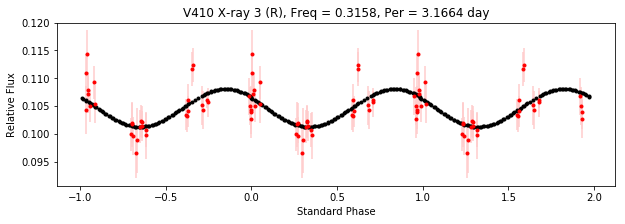

V819 Tau the period of 1.235491411693246


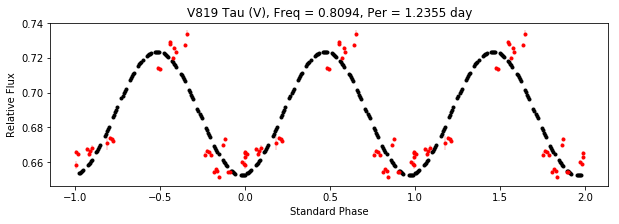

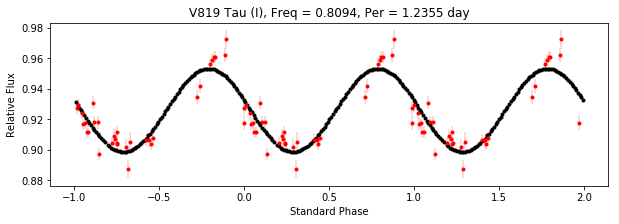

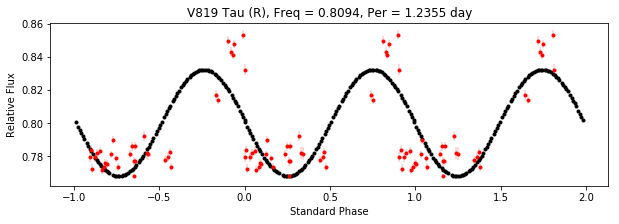

V819 Tau the period of 1.1872253149373702


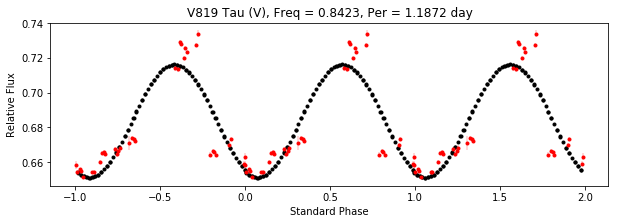

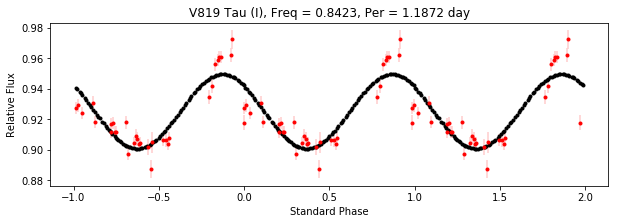

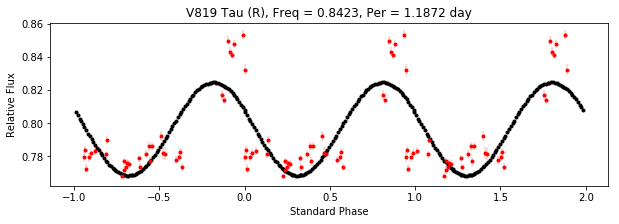

V819 Tau the period of 0.5466073114601643


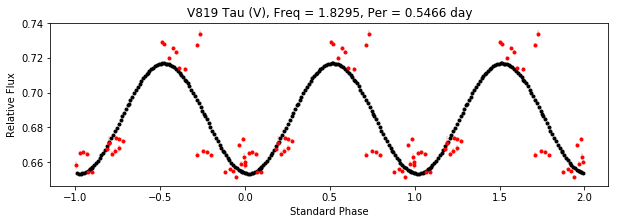

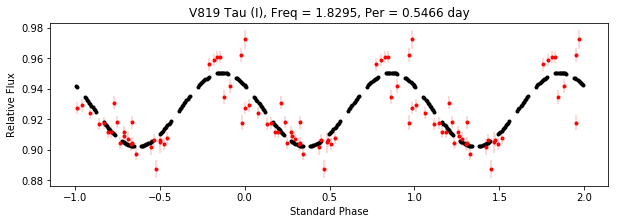

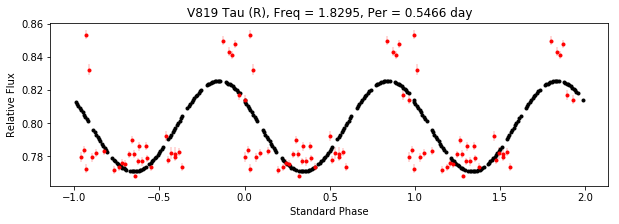

V819 Tau the period of 0.5566188927864766


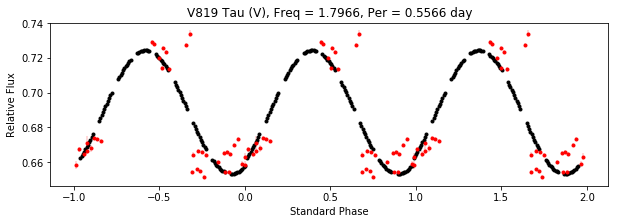

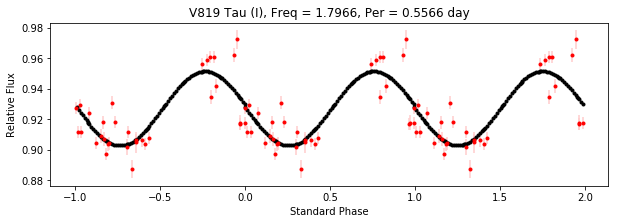

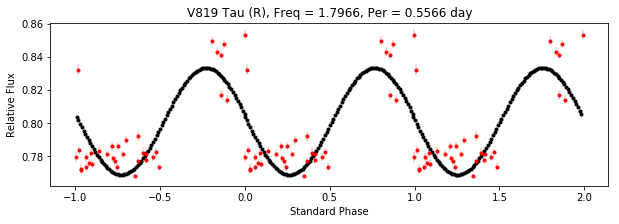

V819 Tau the period of 1.1425885891190977


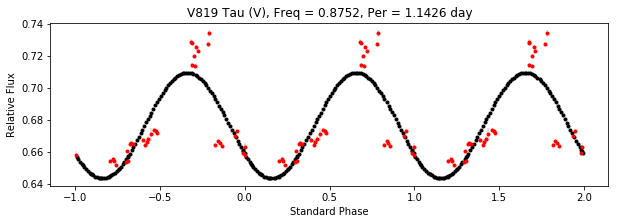

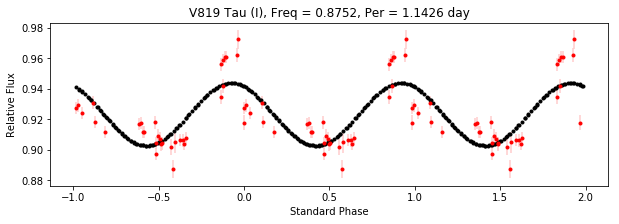

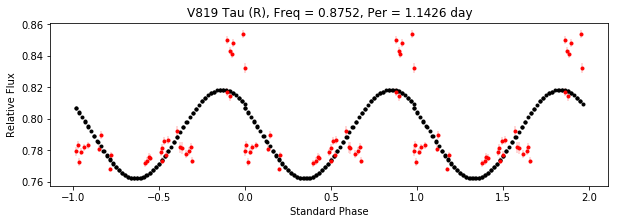

V819 Tau the period of 0.8537116370251768


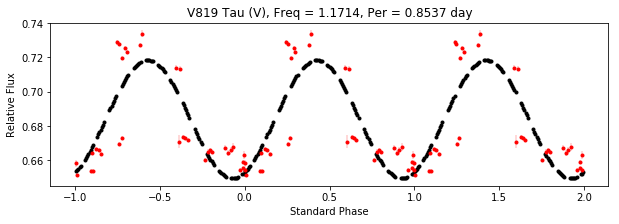

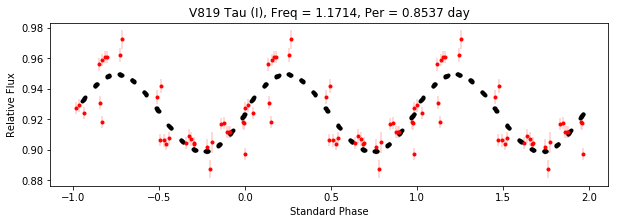

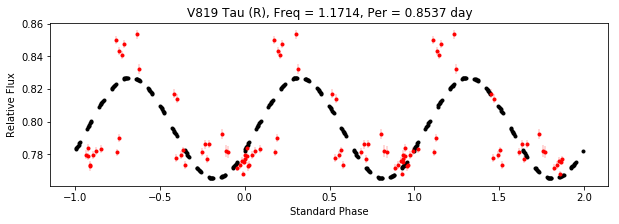

V410 X-ray 1 the period of 1.1872253149373702


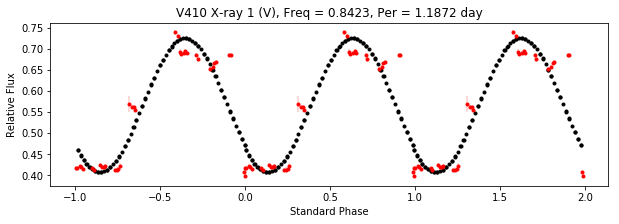

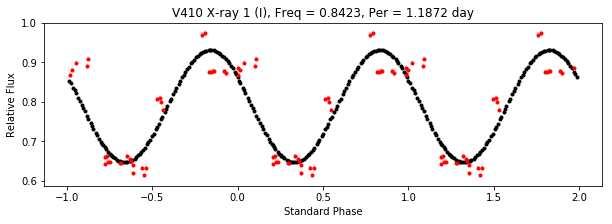

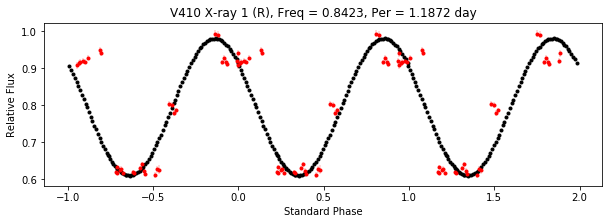

V410 X-ray 1 the period of 1.1425885891190977


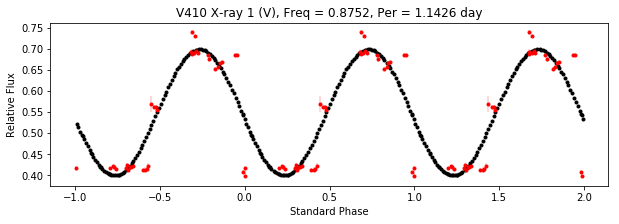

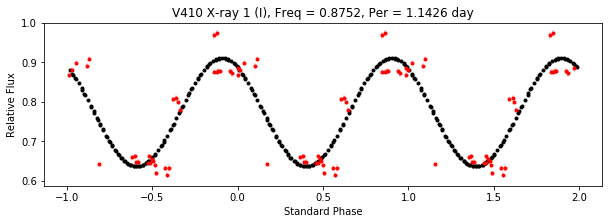

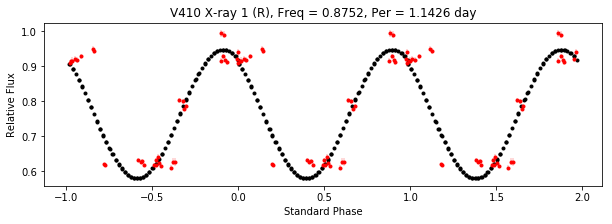

V410 X-ray 1 the period of 0.8783871666742263


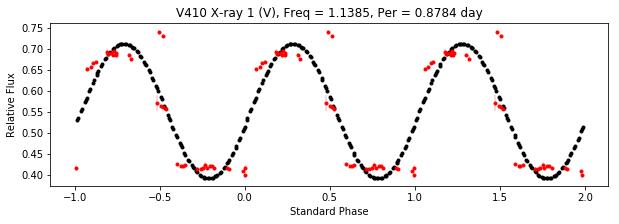

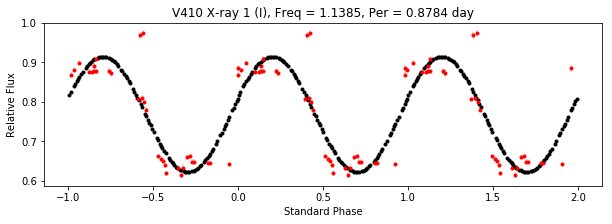

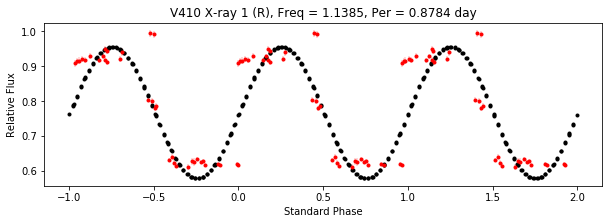

V410 X-ray 1 the period of 0.8537116370251768


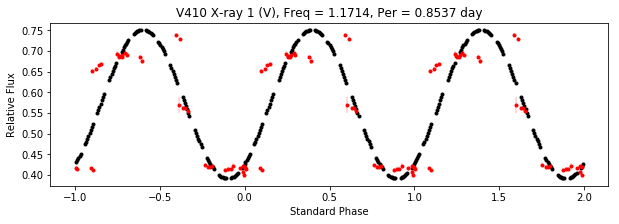

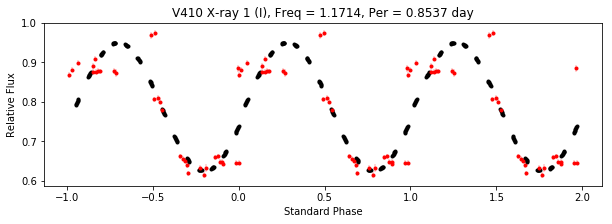

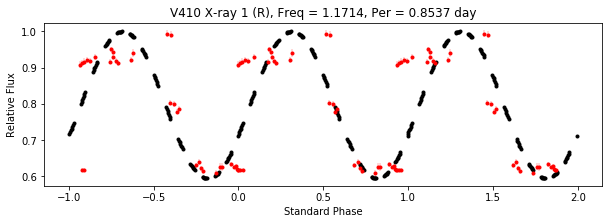

V410 X-ray 1 the period of 1.1011867016607335


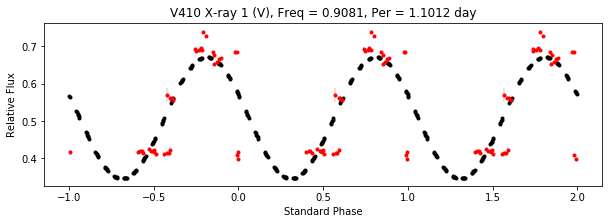

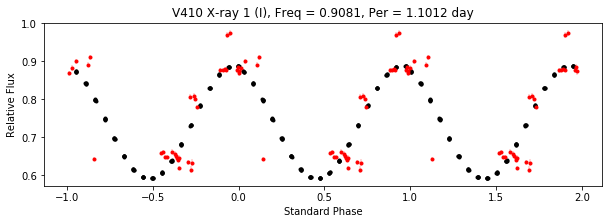

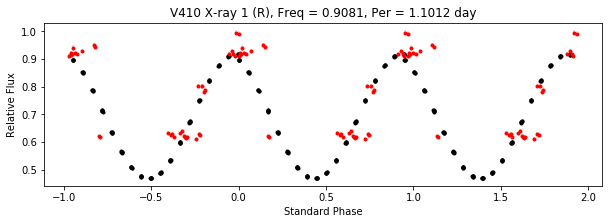

V410 X-ray 1 the period of 0.5369495118848611


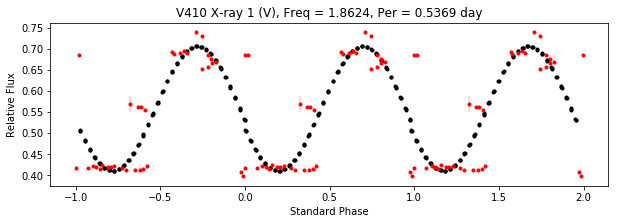

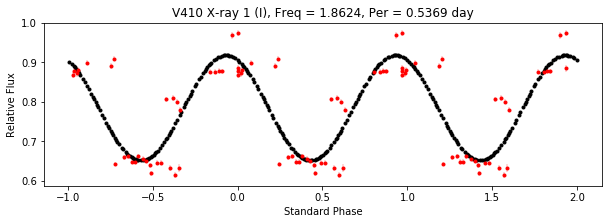

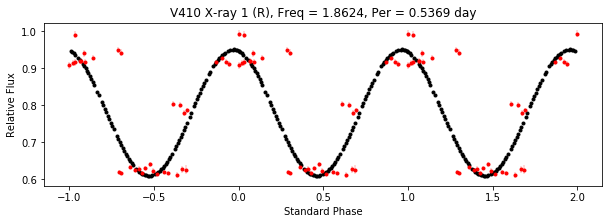

V410 X-ray 1 the period of 0.9045315871424904


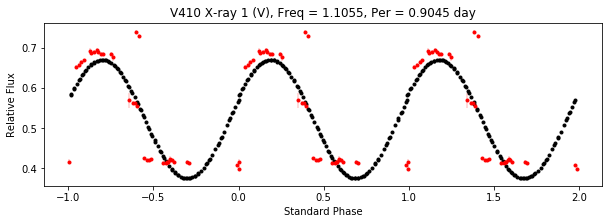

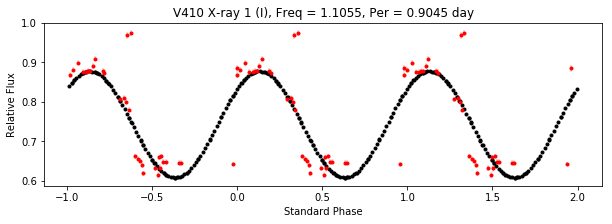

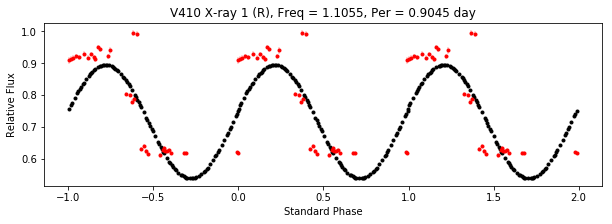

V410 X-ray 1 the period of 0.5466073114601643


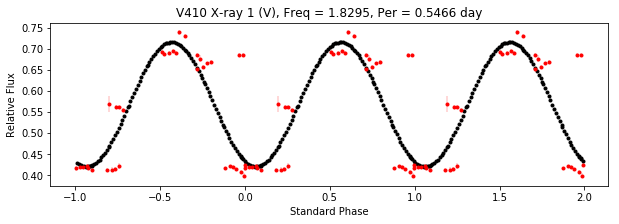

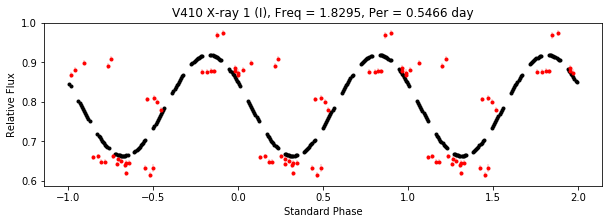

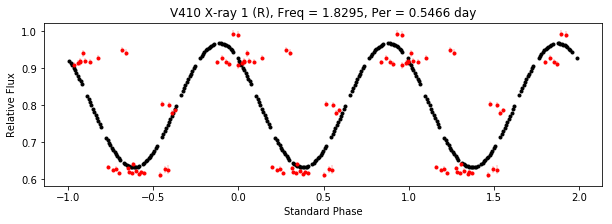

FQ Tau the period of 1.1425885891190977


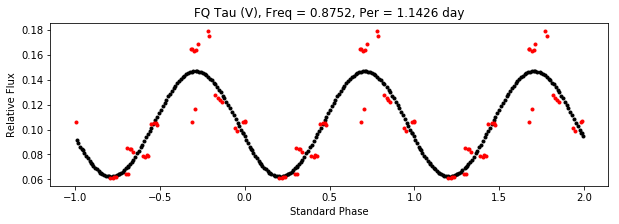

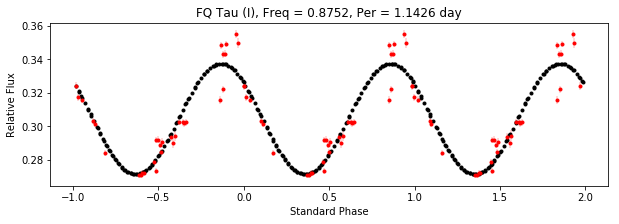

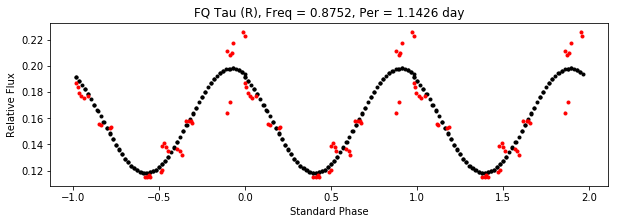

FQ Tau the period of 1.1872253149373702


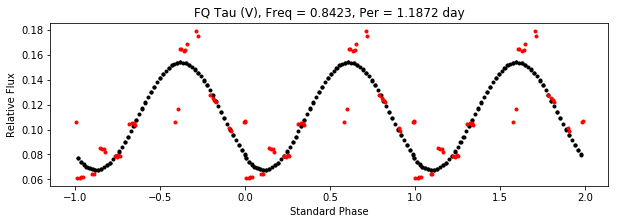

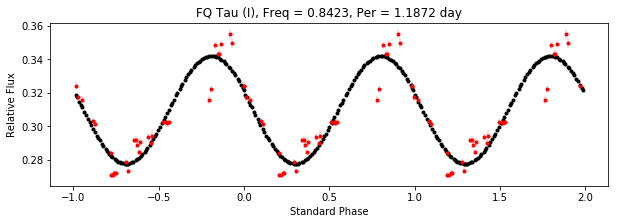

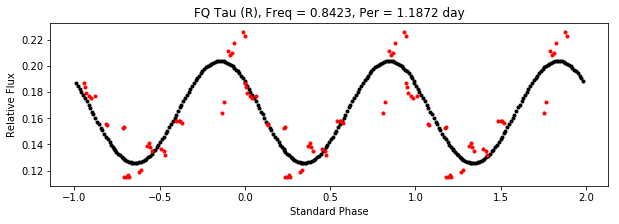

FQ Tau the period of 1.1011867016607335


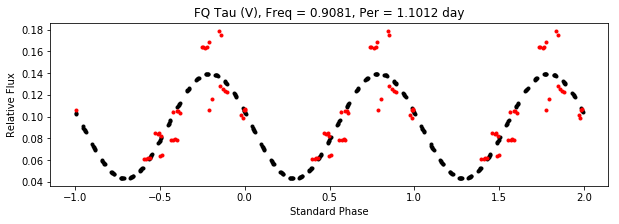

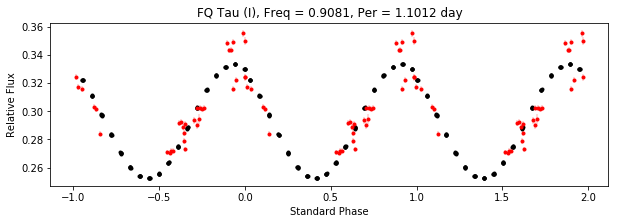

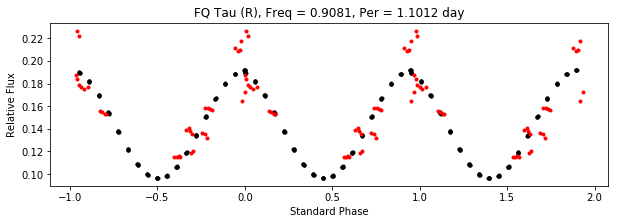

FQ Tau the period of 0.8783871666742263


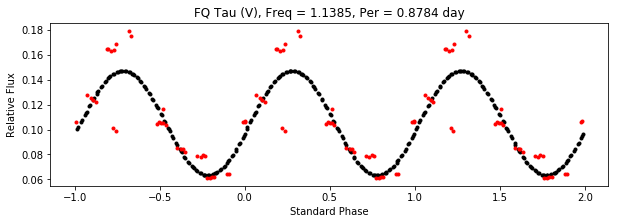

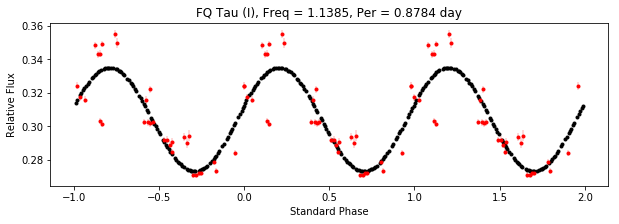

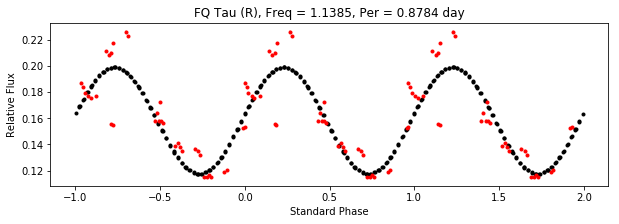

FQ Tau the period of 0.9045315871424904


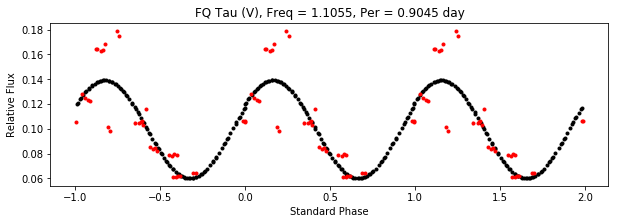

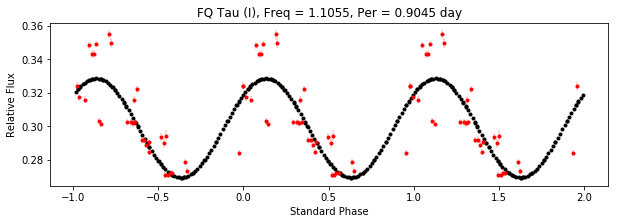

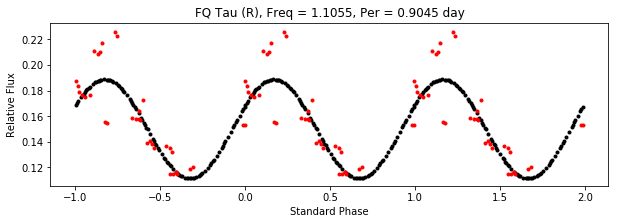

FQ Tau the period of 0.5369495118848611


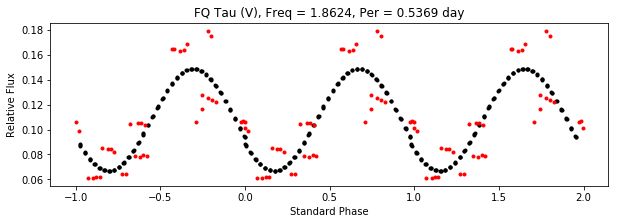

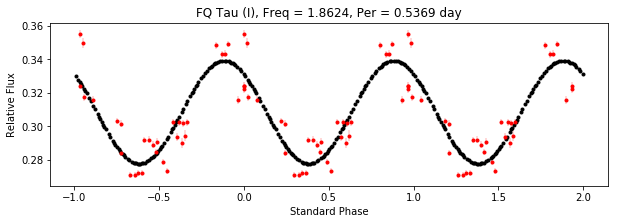

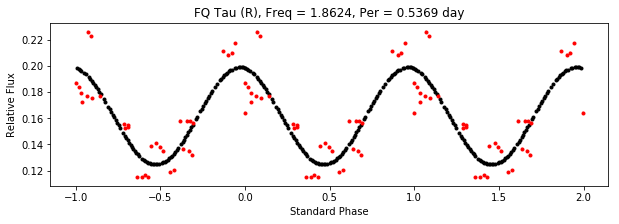

XZ Tau the period of 1.110893032405815


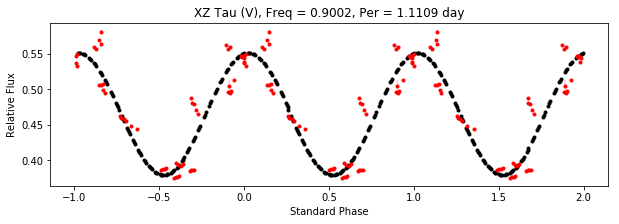

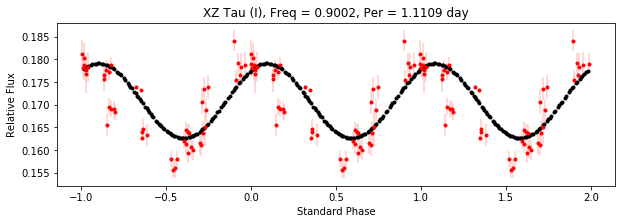

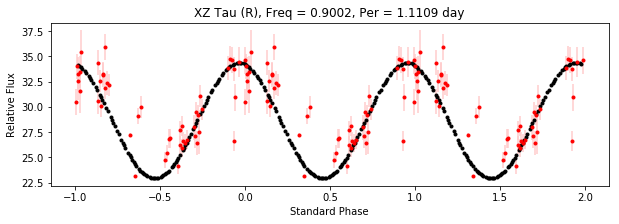

XZ Tau the period of 1.0770694576800928


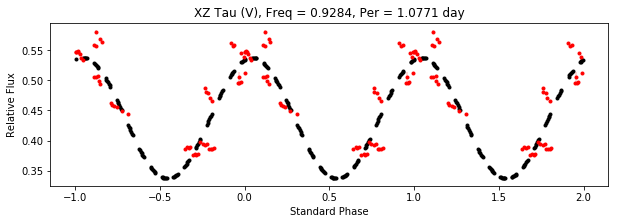

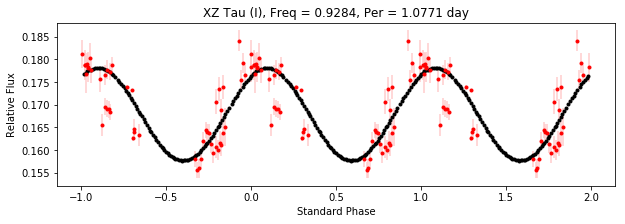

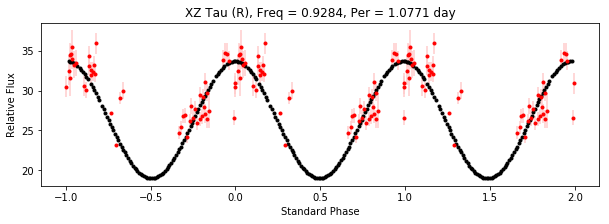

XZ Tau the period of 0.5214187010713577


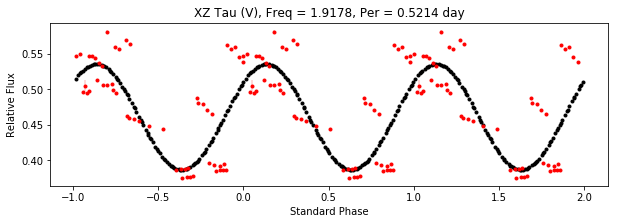

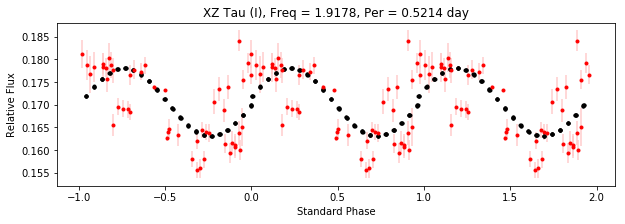

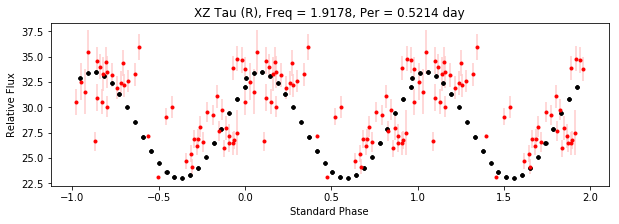

LkHa 267 the period of 2.555304740430618


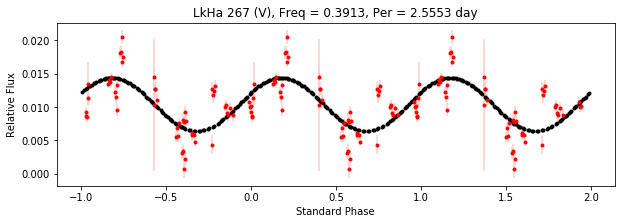

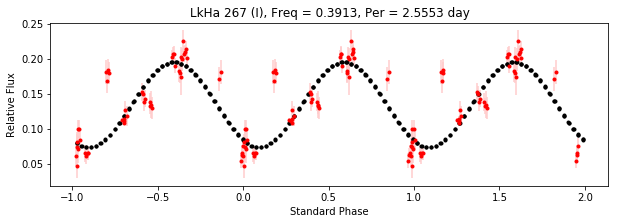

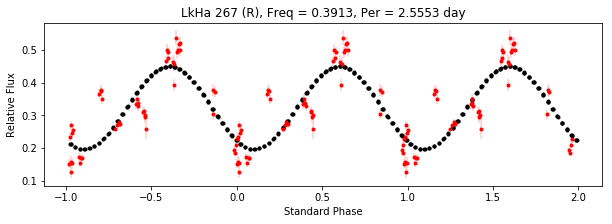

LkHa 267 the period of 0.622319956033626


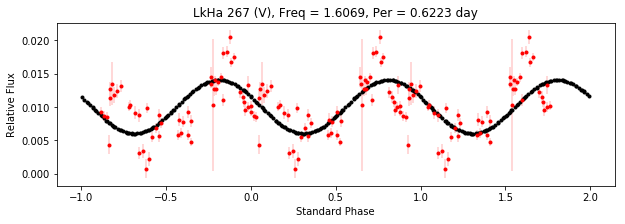

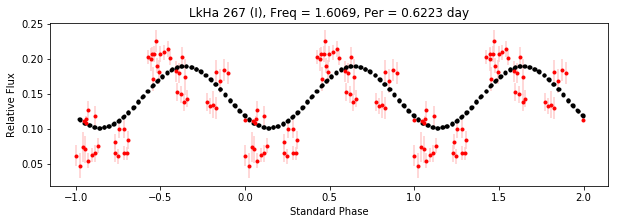

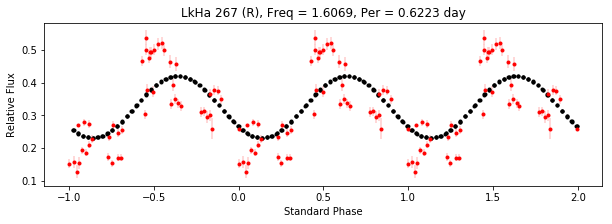

KeyError: ('UX Tau A or B', 'V')

In [13]:
table_dir = glob.glob(direct+'/*test_*.csv')
table = pd.read_csv(table_dir[0])
per_targ = []

filters = ['V','I','R']
min_freq = 0.25
max_freq = 4
        
per_targ = table['Name'] #every single target

for ind in range(0,len(per_targ)): 
    best_per = np.zeros([3,10]) #generating empty best period array
    #making that best period array (contains each band)
    for filt in range(0,len(filters)): #looping through each filter
        time_n = all_targ_data[per_targ[ind],filters[filt]][1] #time for each target
        starflux_n = all_targ_data[per_targ[ind],filters[filt]][0] #star flux with nans
        starfluxerr_n = all_targ_data_err[per_targ[ind],filters[filt]] #error with nans
        starflux = starflux_n[~np.isnan(starflux_n)] #starflux without nans
        starfluxerr = starfluxerr_n[~np.isnan(starfluxerr_n)] #starflux error without nans
        time = time_n[~np.isnan(starflux_n)] #time without nans
     
        f, p = LombScargle(time, starflux, starfluxerr).autopower(minimum_frequency = min_freq, maximum_frequency = max_freq) # default autopower settings
        
        # calculate the period, as inverse of frequency
        per = 1/f
        
        # make an array of the three columns and turn that into a dataframe:
        ls_output_arrays = np.c_[p, f, per]
        ls_output = pd.DataFrame(ls_output_arrays, columns=['Power', 'Frequency', 'Period'])
        
        # now sort the whole dataframe by the “Power” column and save the first 10 rows:
        best_per_df = ls_output.sort_values(by='Power', ascending=False)['Period']
        best_per[filt] = best_per_df[:10].values #saving the 10 strongest periods in this band
    #testing the best period
    for per in range(0,len(best_per[0])-1):
        test_per = best_per[0][per] #looping through the V band periods
        per_diff = np.abs(best_per-test_per) #making a matrix of the differences
        #if there exists 3 places w/ period difference <7 min (assumed 3 places are the 3 bands)
        if len(per_diff[np.where(per_diff<0.005)])==3: 
            print(per_targ[ind]+' the period of '+str(test_per)) #print common V band period
            #then model that period on all three bands
            for filt in range(0,len(filters)):
                time_n = all_targ_data[per_targ[ind],filters[filt]][1] #time for each target
                starflux_n = all_targ_data[per_targ[ind],filters[filt]][0] #star flux with nans
                starfluxerr_n = all_targ_data_err[per_targ[ind],filters[filt]] #error with nans
                starflux = starflux_n[~np.isnan(starflux_n)] #starflux without nans
                starfluxerr = starfluxerr_n[~np.isnan(starfluxerr_n)] #starflux error without nans
                time = time_n[~np.isnan(starflux_n)] #time without nans
                
                time_ep = time[2] #time epoch to test phase against CHANGE
                phase_data = ((time-time_ep)/test_per) #phase
                stnd_phase_data = phase_data%1 #normalized phase
                
                test_freq = 1/test_per
                
                time_model = np.linspace(np.min(time), np.max(time), 100) #a model of the time
                mag_model = LombScargle(time, starflux, starfluxerr).model(time_model, test_freq) #model of the best period
                phase_LS = ((time_model-time_ep)/test_per) #phase from the model
                stnd_phase_LS = phase_LS%1 #normalized phase from the model
            
                #making a new plot for periodigram
                fig, ax = plt.subplots(figsize=(10,3)) #setting up a new plot
                plt.plot(stnd_phase_LS, mag_model, 'k.') #plot the model normal phasecolor='red', ecolor='#ffcccc'
                plt.plot(stnd_phase_LS+-np.max(stnd_phase_LS), mag_model, 'k.') #as well as model +phase
                plt.plot(stnd_phase_LS+np.max(stnd_phase_LS), mag_model, 'k.') #and model -phase
                
                plt.errorbar(stnd_phase_data + -np.max(stnd_phase_data), starflux, starfluxerr, fmt='.', color='red', ecolor='#ffcccc') #-phase data
                plt.errorbar(stnd_phase_data + 0, starflux, starfluxerr, fmt='.', color='red', ecolor='#ffcccc') #normal phase data
                plt.errorbar(stnd_phase_data + np.max(stnd_phase_data), starflux, starfluxerr, fmt='.', color='red', ecolor='#ffcccc') #+phase data
               
                plt.xlabel('Standard Phase')
                plt.ylabel('Relative Flux')
                plt.title(per_targ[ind]+' ('+filters[filt]+')'+', '+'Freq = '+str(round(test_freq,4))+', Per = '+str(round(test_per,4))+' day')
                plt.show()

Text(0,0.5,u'Counts')

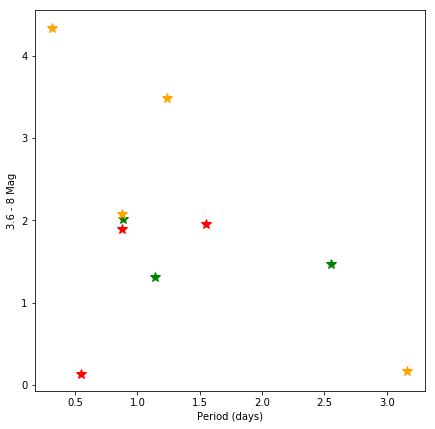

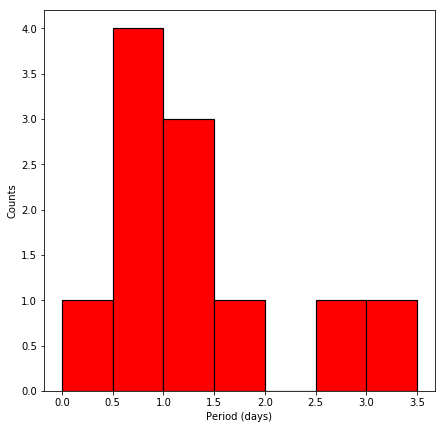

In [14]:
table_dir = glob.glob(direct+'/Star*test_*.csv')
table = pd.read_csv(table_dir[0])
peri = []
b_dust = []
o_dust = []
g_dust = []
b_peri = []
o_peri = []
g_peri = []

for ind in range(0,len(table['Name'])):
    if np.isnan(table['Rotational Period (days)'][ind])==False:
        target = table['Name'][ind]
        peri.append(table['Rotational Period (days)'][ind])
        if table['Quality'][ind]=='Bad':
            b_peri.append(table['Rotational Period (days)'][ind])
            b_dust.append(table['3.6-8Mag'][ind])
        elif table['Quality'][ind]=='Good':
            g_peri.append(table['Rotational Period (days)'][ind])
            g_dust.append(table['3.6-8Mag'][ind])
        else:
            o_peri.append(table['Rotational Period (days)'][ind])
            o_dust.append(table['3.6-8Mag'][ind])

fig, ax = plt.subplots(figsize=(7,7)) #making a new plot
plt.plot(g_peri,g_dust,'g*',markersize=10)
plt.plot(b_peri,b_dust,'r*',markersize=10)
plt.plot(o_peri,o_dust,'*',color = 'orange',markersize=10)

plt.xlabel('Period (days)')
plt.ylabel('3.6 - 8 Mag')

n_bins = [0,0.5,1,1.5,2,2.5,3,3.5]
fig, ax = plt.subplots(figsize=(7,7))
plt.hist(peri,bins=n_bins,facecolor='r',edgecolor='black', linewidth=1.2)
plt.xlabel('Period (days)')
plt.ylabel('Counts')

(5.72, 5.78)

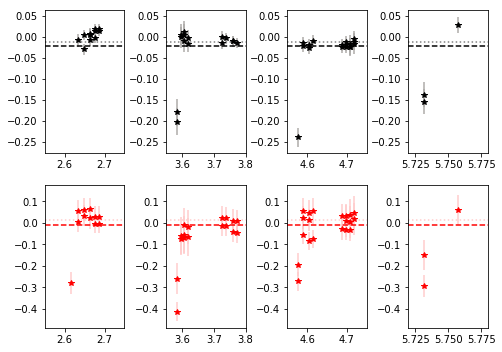

In [27]:
target = 'HL Tau'
v_data = all_targ_data[target,'V'][0]
v_norm = v_data/np.nanmedian(v_data)
v_time = all_targ_data[target,'V'][1]
v_nerr = v_norm*(all_targ_data_err[target,'V']/np.nanmedian(all_targ_data[target,'V'][0]))

i_data = all_targ_data[target,'I'][0]
i_norm = i_data/np.nanmedian(i_data)
i_time = all_targ_data[target,'I'][1]
i_nerr = i_norm*(all_targ_data_err[target,'I']/np.nanmedian(all_targ_data[target,'I'][0]))

r_data = all_targ_data[target,'R'][0]
r_norm = r_data/np.nanmedian(r_data)
r_time = all_targ_data[target,'R'][1]
r_nerr = r_norm*(all_targ_data_err[target,'R']/np.nanmedian(all_targ_data[target,'R'][0]))

VI_color = []
RI_color = []
VI_time = []
RI_time = []
VI_err = []
RI_err = []
    
for itim in range(0,len(i_time)):
    for vtim in range(0,len(v_time)):
        if np.abs(v_time[vtim] - i_time[itim]) < 0.015:
            #print(v_data[itim]-i_data[itim])
            VI_color.append(v_norm[vtim]-i_norm[itim])
            VI_time.append(i_time[itim])
            VI_err.append(np.sqrt(np.square(v_nerr[vtim])+np.square(i_nerr[itim])))
                
    for rtim in range(0,len(r_time)):
        if np.abs(r_time[rtim] - i_time[itim]) < 0.015:
            RI_color.append(r_norm[rtim]-i_norm[itim]) 
            RI_time.append(i_time[itim])
            RI_err.append(np.sqrt(np.square(r_nerr[rtim])+np.square(i_nerr[itim])))
VI_mean = np.nanmean(VI_color)
VI_med = np.nanmedian(VI_color)
RI_mean = np.nanmean(RI_color)
RI_med = np.nanmedian(RI_color)

xmin = 2.55
xmax = 2.75
fig, ax = plt.subplots(nrows = 2, ncols = 4, figsize=(7,5))
ax[0,0].errorbar(VI_time,VI_color,VI_err, fmt='*', color='black', ecolor='#ADABA8')
ax[0,0].axhline(y=VI_mean, color='black',linestyle='--')
ax[0,0].axhline(y=VI_med, color='grey',linestyle=':')
ax[0,0].set_xlim([xmin,xmax]) 
plt.tight_layout()

ax[1,0].errorbar(RI_time,RI_color,RI_err, fmt='*', color='red', ecolor='#ffcccc')
ax[1,0].axhline(y=RI_mean, color='red',linestyle='--')
ax[1,0].axhline(y=RI_med, color='#ffcccc',linestyle=':')
ax[1,0].set_xlim([xmin,xmax])


xmin = 3.55
xmax = 3.8
ax[0,1].errorbar(VI_time,VI_color,VI_err, fmt='*', color='black', ecolor='#ADABA8')
ax[0,1].axhline(y=VI_mean, color='black',linestyle='--')
ax[0,1].axhline(y=VI_med, color='grey',linestyle=':')
ax[0,1].set_xlim([xmin,xmax]) 

ax[1,1].errorbar(RI_time,RI_color,RI_err, fmt='*', color='red', ecolor='#ffcccc')
ax[1,1].axhline(y=RI_mean, color='red',linestyle='--')
ax[1,1].axhline(y=RI_med, color='#ffcccc',linestyle=':')
ax[1,1].set_xlim([xmin,xmax])

xmin = 4.55
xmax = 4.75
ax[0,2].errorbar(VI_time,VI_color,VI_err, fmt='*', color='black', ecolor='#ADABA8')
ax[0,2].axhline(y=VI_mean, color='black',linestyle='--')
ax[0,2].axhline(y=VI_med, color='grey',linestyle=':')
ax[0,2].set_xlim([xmin,xmax]) 

ax[1,2].errorbar(RI_time,RI_color,RI_err, fmt='*', color='red', ecolor='#ffcccc')
ax[1,2].axhline(y=RI_mean, color='red',linestyle='--')
ax[1,2].axhline(y=RI_med, color='#ffcccc',linestyle=':')
ax[1,2].set_xlim([xmin,xmax]) 

xmin = 5.72
xmax = 5.78
ax[0,3].errorbar(VI_time,VI_color,VI_err, fmt='*', color='black', ecolor='#ADABA8')
ax[0,3].axhline(y=VI_mean, color='black',linestyle='--')
ax[0,3].axhline(y=VI_med, color='grey',linestyle=':')
ax[0,3].set_xlim([xmin,xmax]) 

ax[1,3].errorbar(RI_time,RI_color,RI_err, fmt='*', color='red', ecolor='#ffcccc')
ax[1,3].axhline(y=RI_mean, color='red',linestyle='--')
ax[1,3].axhline(y=RI_med, color='#ffcccc',linestyle=':')
ax[1,3].set_xlim([xmin,xmax]) 




FR Tau the period of 1.2878482889772729


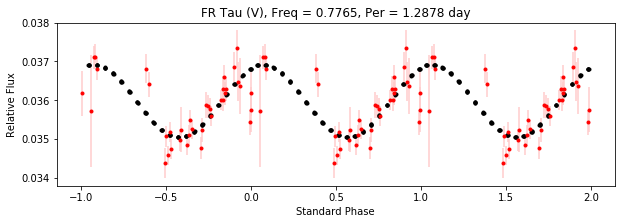

FR Tau the period of 2.2307408772048087


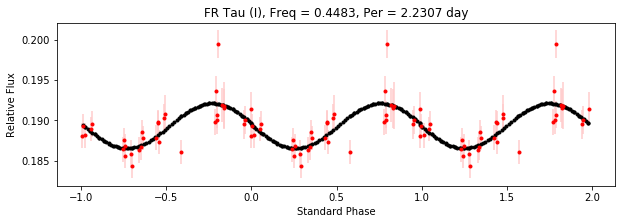

FR Tau the period of 0.37154852749520784


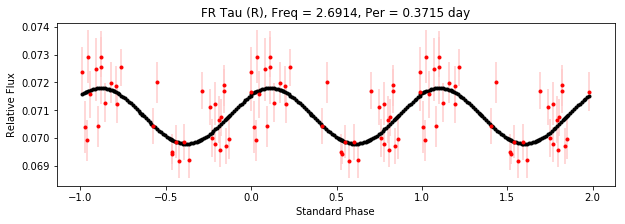

FR Tau the period of 4.0


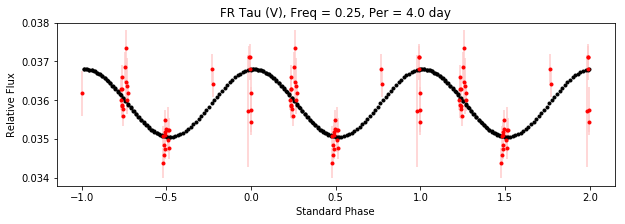

FR Tau the period of 1.8267431330588324


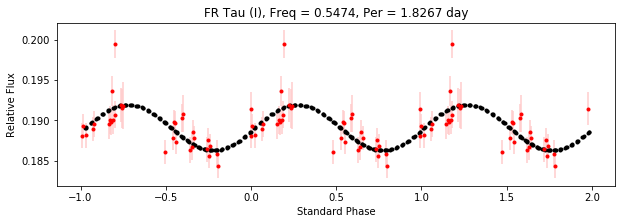

FR Tau the period of 0.5992783352603647


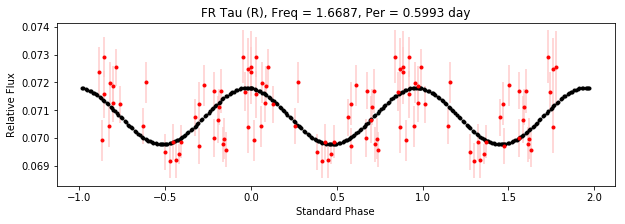

FR Tau the period of 0.8303845890838539


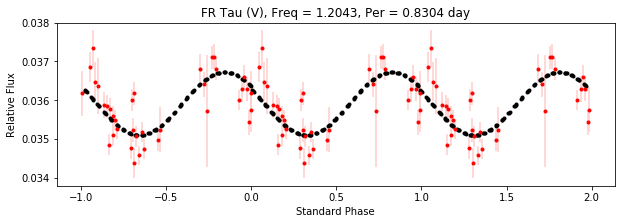

FR Tau the period of 2.077583247457685


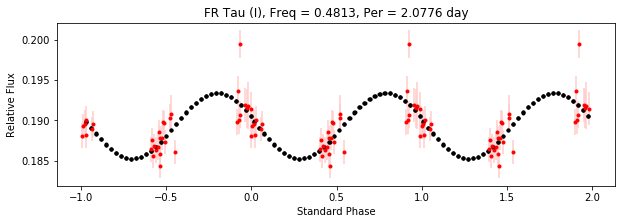

FR Tau the period of 0.3761595979242109


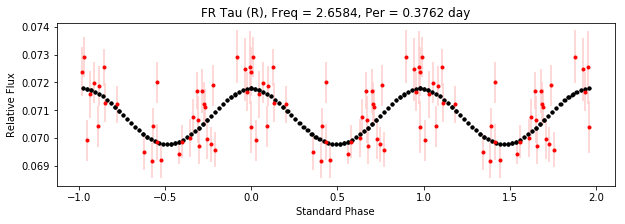

FR Tau the period of 0.808298424070466


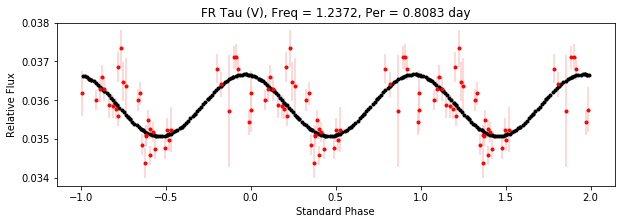

FR Tau the period of 0.6945942843718788


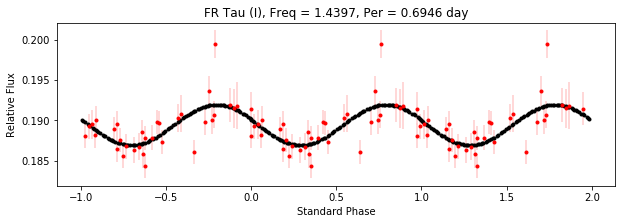

FR Tau the period of 0.5876593476154653


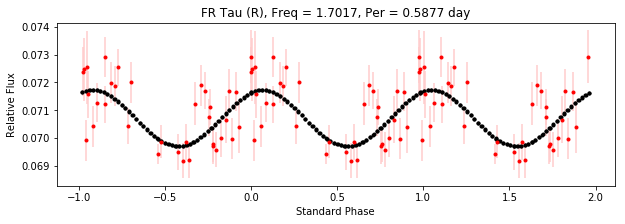

FQ Tau the period of 1.1425885891190977


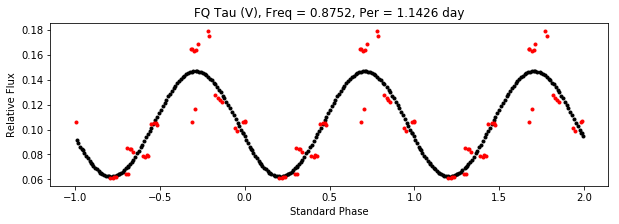

FQ Tau the period of 1.1390927912230746


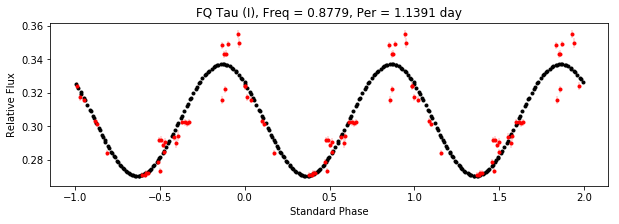

FQ Tau the period of 1.1404383407533265


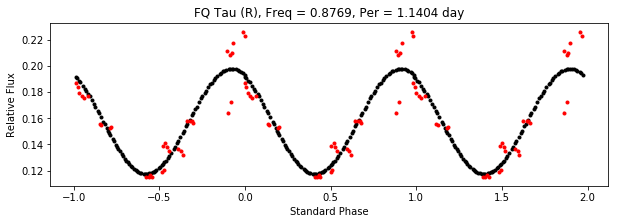

FQ Tau the period of 1.1872253149373702


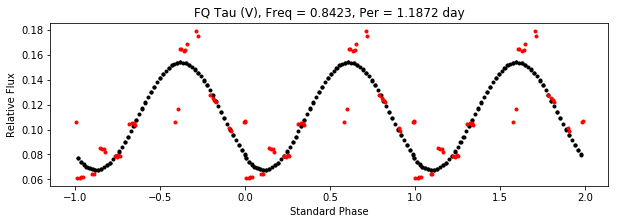

FQ Tau the period of 1.1836495207846285


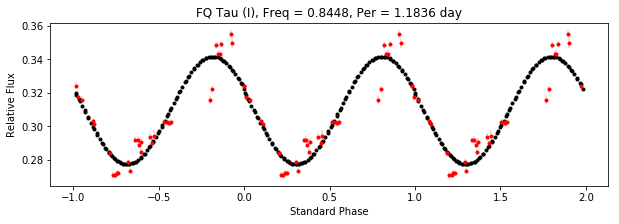

FQ Tau the period of 1.0990843985637337


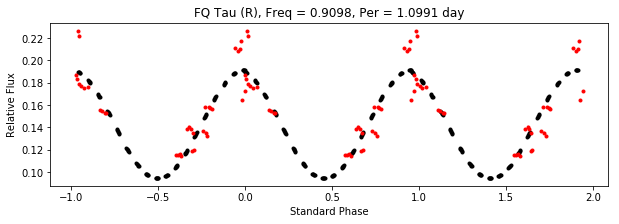

FQ Tau the period of 1.1011867016607335


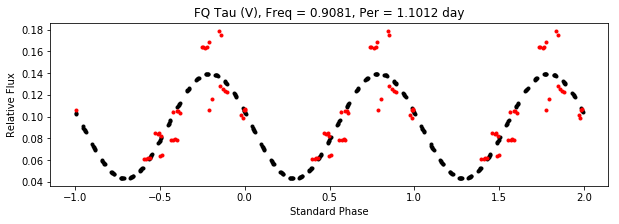

FQ Tau the period of 1.0977689098067924


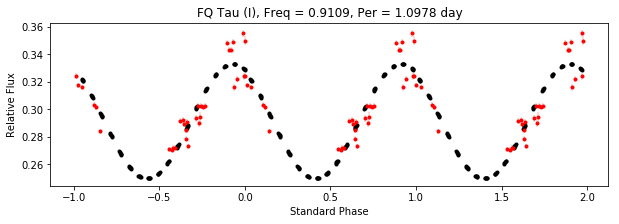

FQ Tau the period of 1.1850259017241773


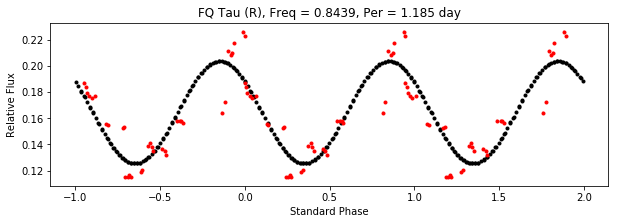

FQ Tau the period of 0.8783871666742263


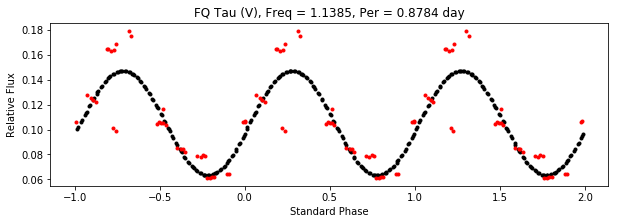

FQ Tau the period of 0.5349597807583528


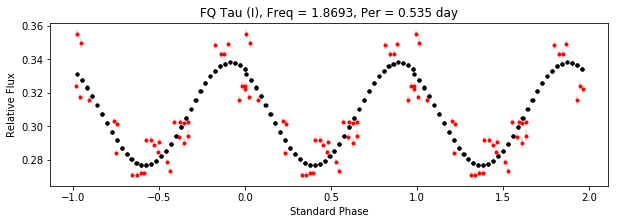

FQ Tau the period of 0.8765815921190974


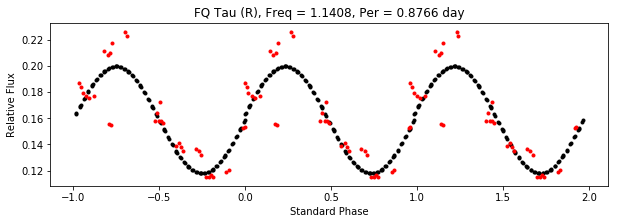

UX Tau A the period of 0.42191576594359254


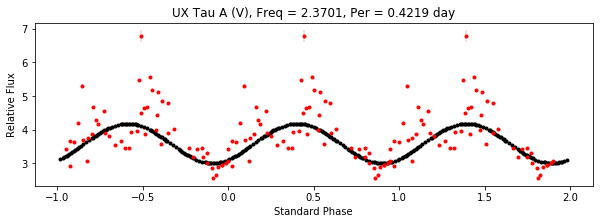

UX Tau A the period of 0.5515214452267677


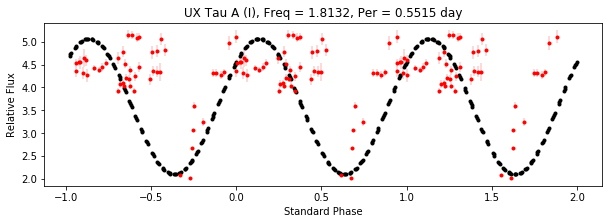

UX Tau A the period of 1.0730591867446257


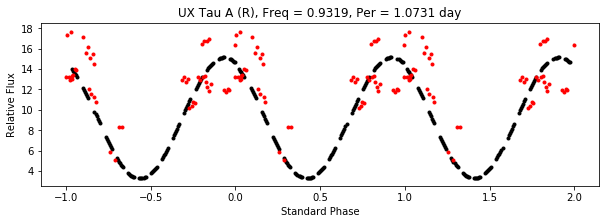

UX Tau A the period of 0.4270086759813734


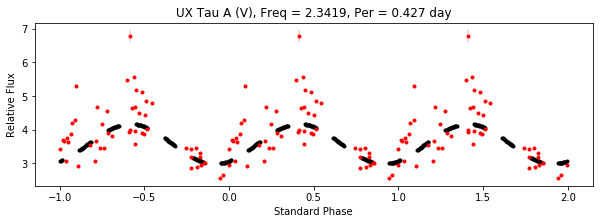

UX Tau A the period of 0.2629744854586897


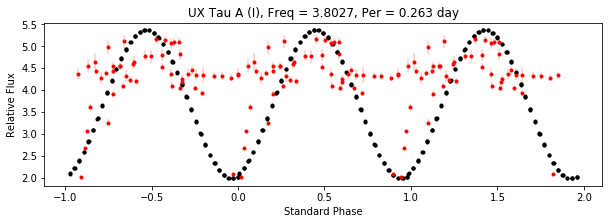

UX Tau A the period of 1.041310699397278


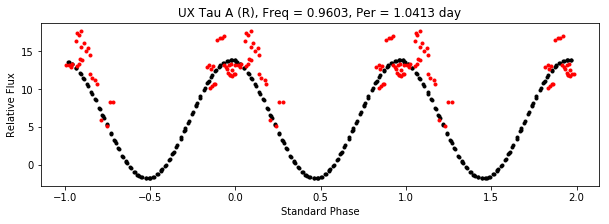

UX Tau A the period of 0.29765974231595704


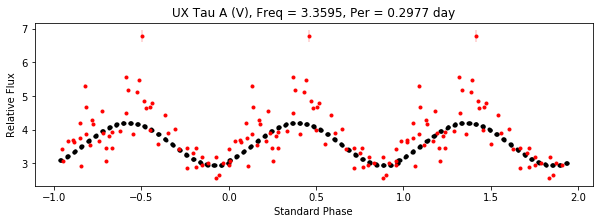

UX Tau A the period of 0.5603041582904721


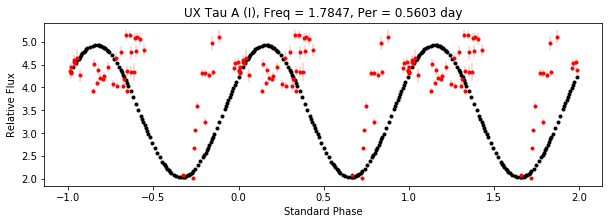

UX Tau A the period of 0.5191098656166232


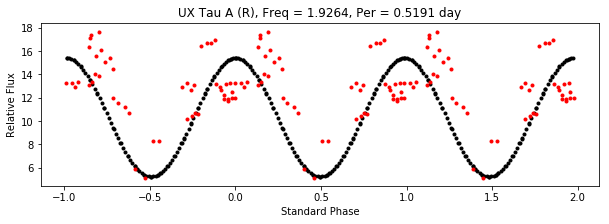

UX Tau A the period of 0.7551701134250673


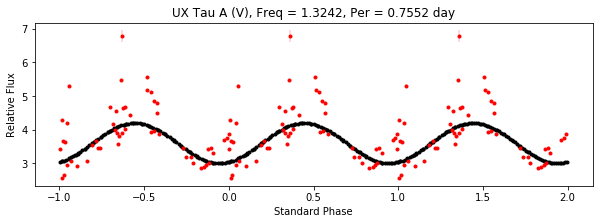

UX Tau A the period of 0.35613699912750646


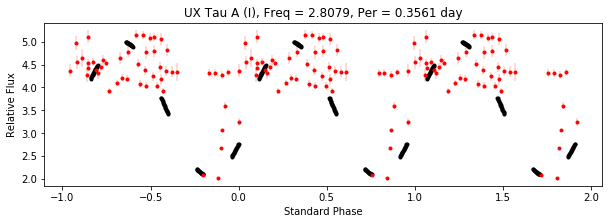

UX Tau A the period of 1.1068045127945594


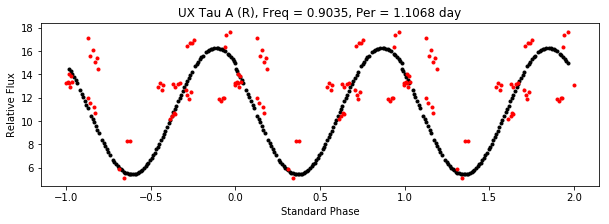

UX Tau B the period of 0.42191576594359254


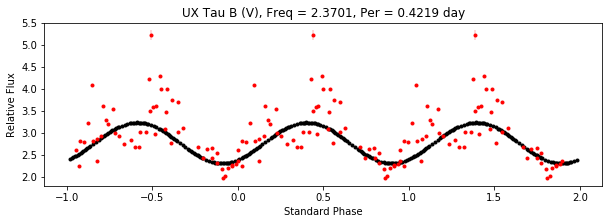

UX Tau B the period of 0.2629744854586897


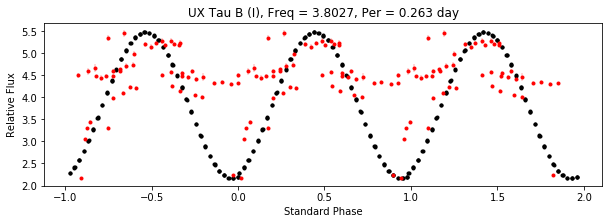

UX Tau B the period of 0.8223371009981961


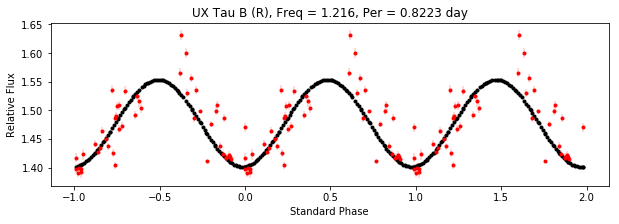

UX Tau B the period of 0.4270086759813734


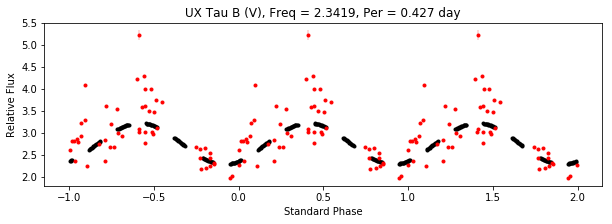

UX Tau B the period of 0.5603041582904721


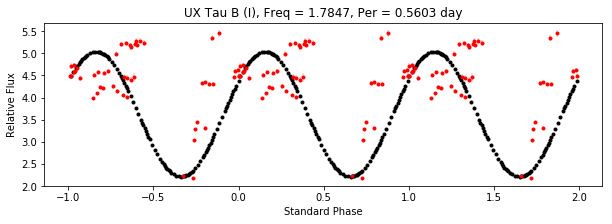

UX Tau B the period of 0.8420108257146017


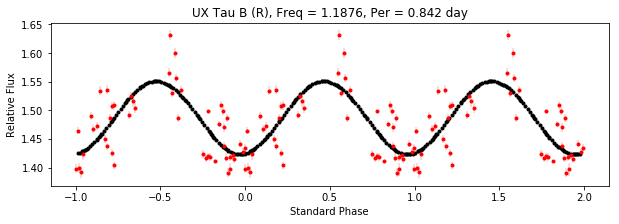

UX Tau B the period of 0.29765974231595704


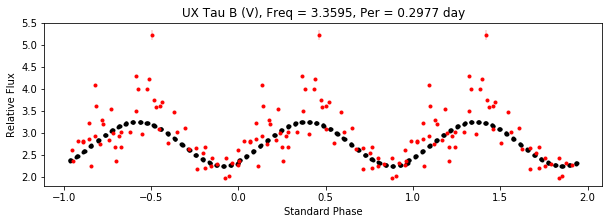

UX Tau B the period of 0.35613699912750646


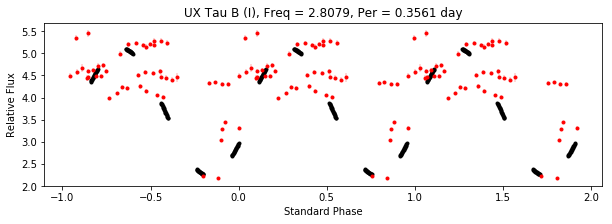

UX Tau B the period of 0.4523851604492786


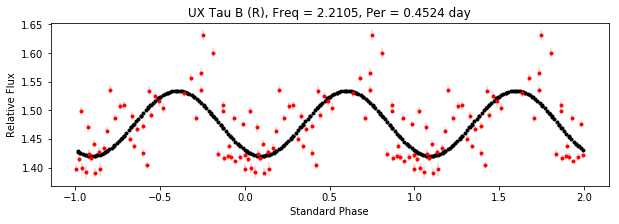

UX Tau B the period of 0.7551701134250673


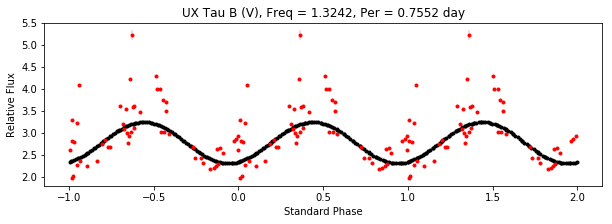

UX Tau B the period of 0.5515214452267677


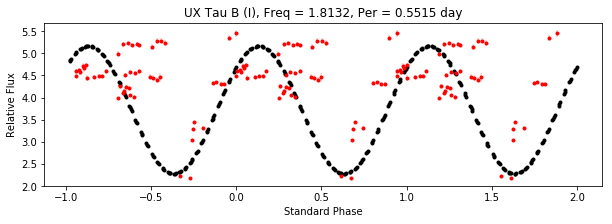

UX Tau B the period of 0.29378436754615983


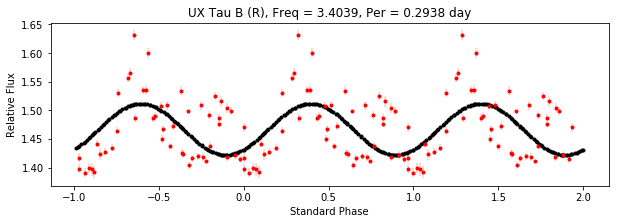

HH 30 the period of 1.1074867361419305


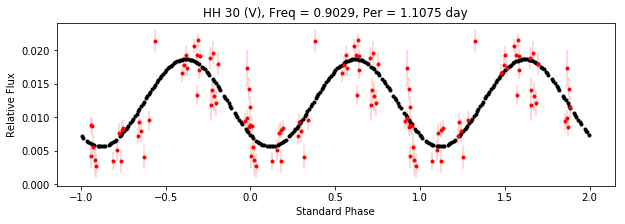

HH 30 the period of 0.9069175500220567


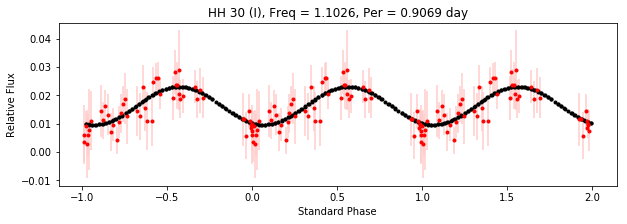

HH 30 the period of 0.4523851604492786


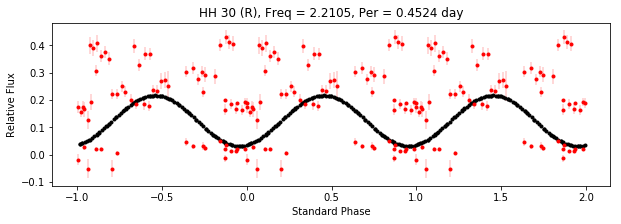

HH 30 the period of 1.0737283292491762


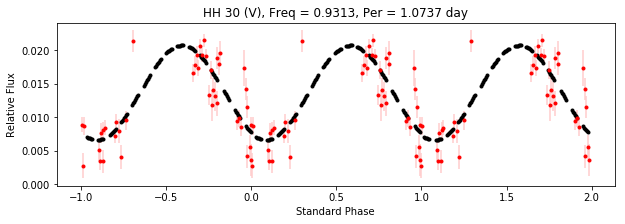

HH 30 the period of 0.8841285296992438


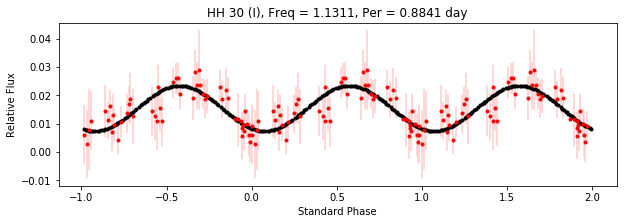

HH 30 the period of 0.3092740474000282


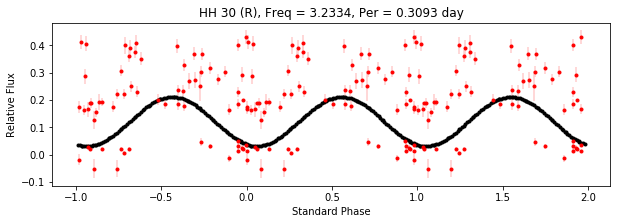

HH 30 the period of 0.9077146078663091


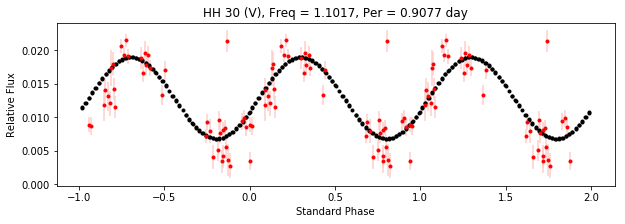

HH 30 the period of 1.0728360711984113


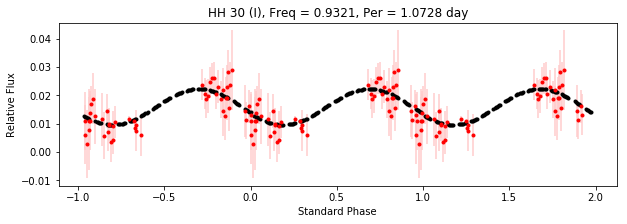

HH 30 the period of 0.3120158689840339


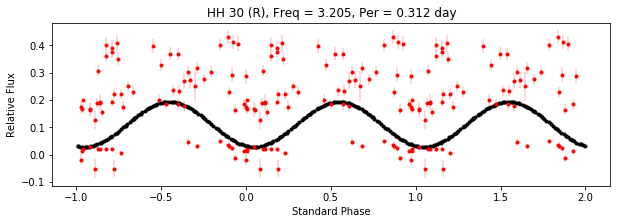

HH 30 the period of 1.143436802642214


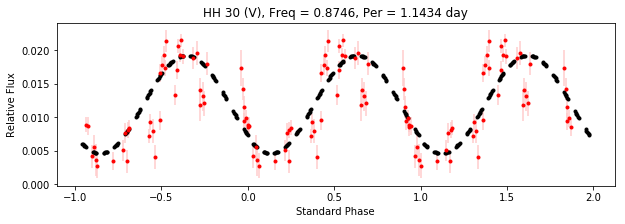

HH 30 the period of 1.1065770334564744


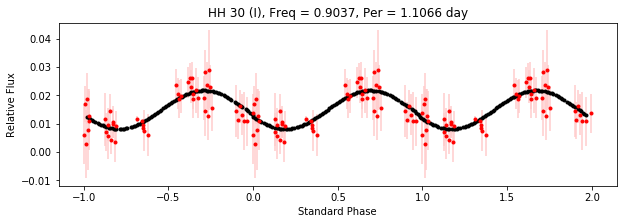

HH 30 the period of 0.4582756881004029


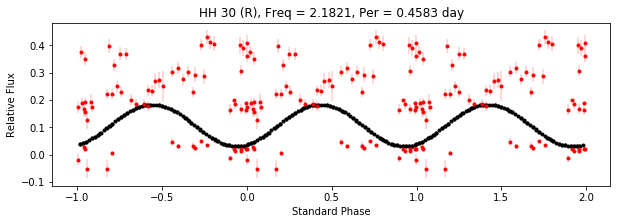

V410 X-ray 6 the period of 0.6253408096904453


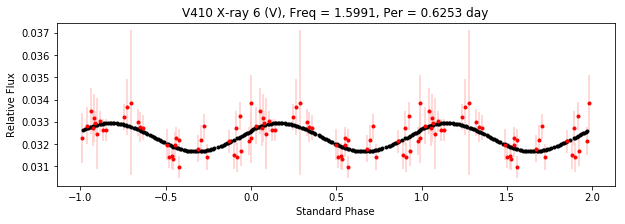

V410 X-ray 6 the period of 1.1390927912230746


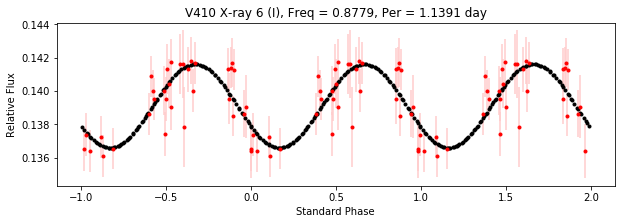

V410 X-ray 6 the period of 1.2855476620210766


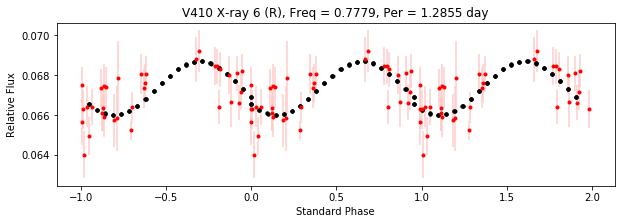

V410 X-ray 6 the period of 1.7269498507901826


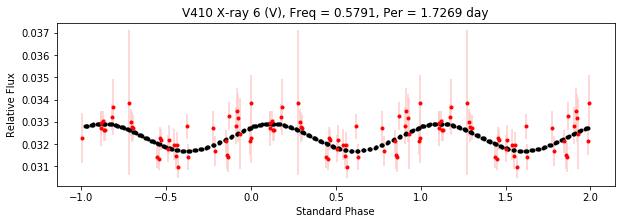

V410 X-ray 6 the period of 1.0977689098067924


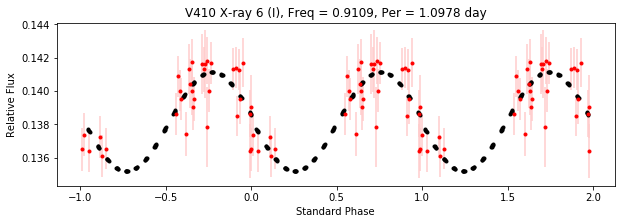

V410 X-ray 6 the period of 0.9026878118229636


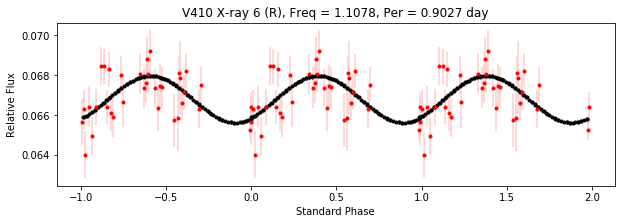

V410 X-ray 6 the period of 1.6340906035354665


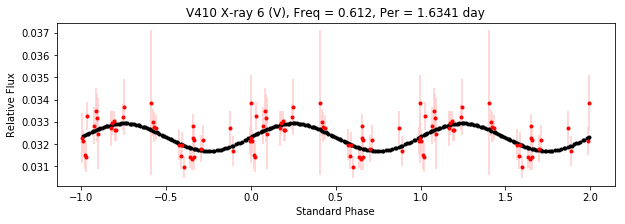

V410 X-ray 6 the period of 1.1836495207846285


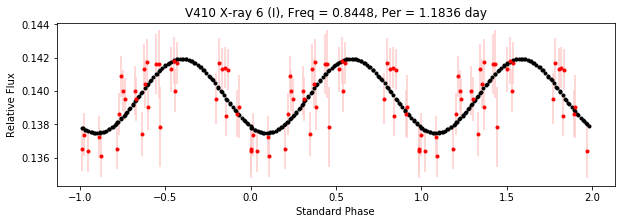

V410 X-ray 6 the period of 1.1404383407533265


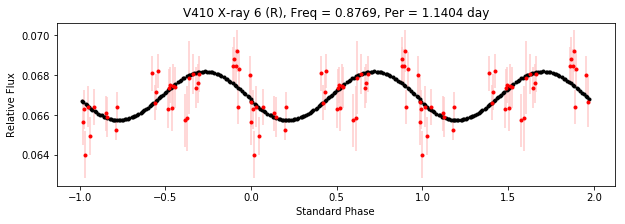

V410 X-ray 6 the period of 0.6384789116851847


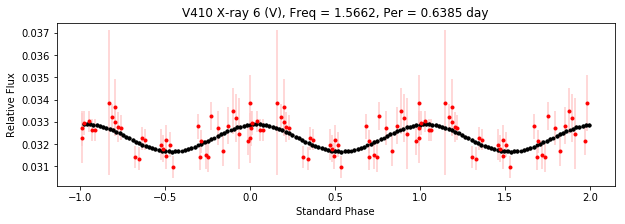

V410 X-ray 6 the period of 0.5349597807583528


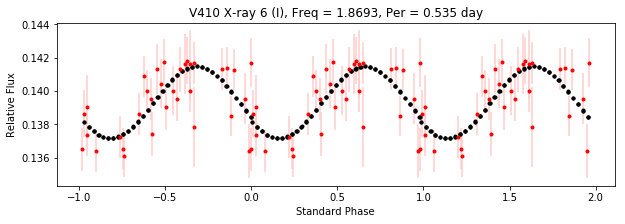

V410 X-ray 6 the period of 0.930396746265744


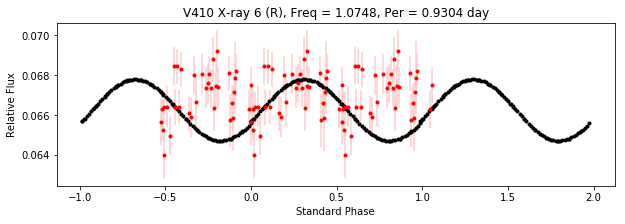

V410 X-ray 3 the period of 0.96178495131064


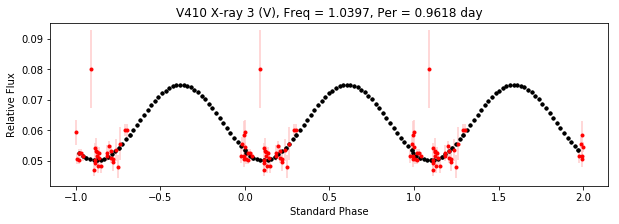

V410 X-ray 3 the period of 2.8641741599185853


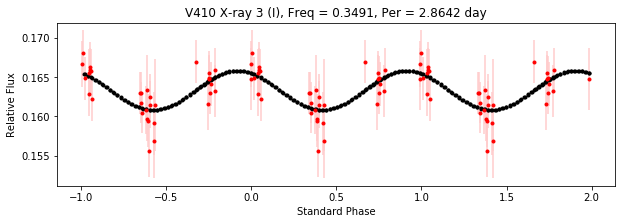

V410 X-ray 3 the period of 0.7469656829908263


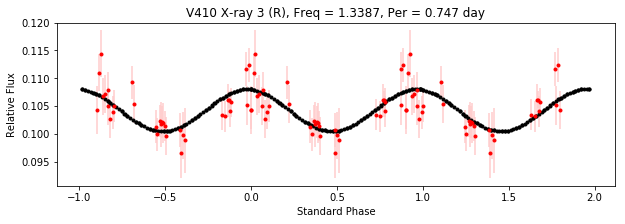

V410 X-ray 3 the period of 0.48548264705279176


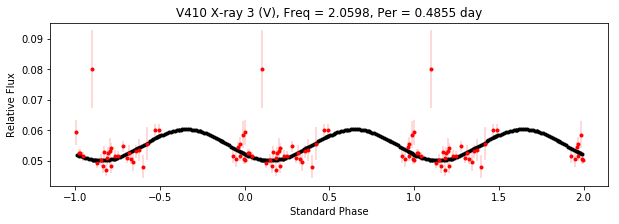

V410 X-ray 3 the period of 3.16361735490446


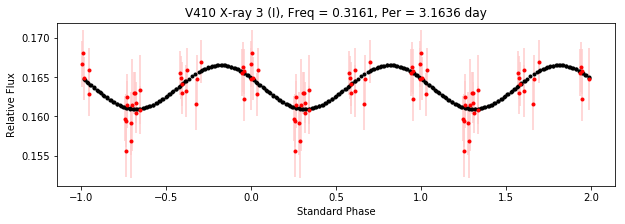

V410 X-ray 3 the period of 2.8655164264281856


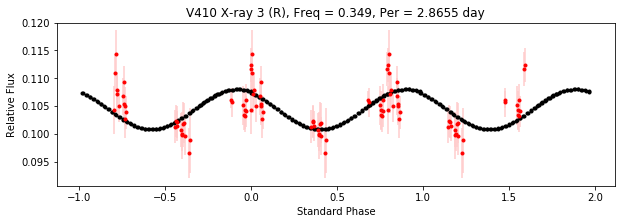

V410 X-ray 3 the period of 0.932280082798638


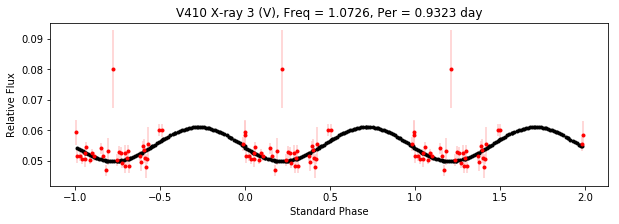

V410 X-ray 3 the period of 0.745963268795309


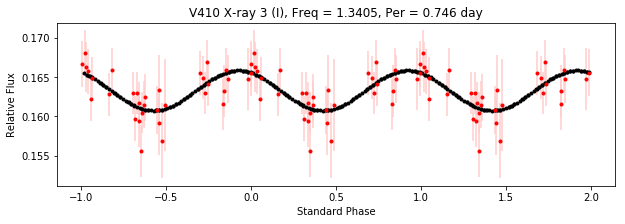

V410 X-ray 3 the period of 0.729000060166409


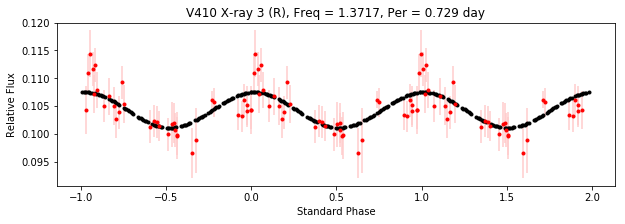

V410 X-ray 3 the period of 0.47784897203325155


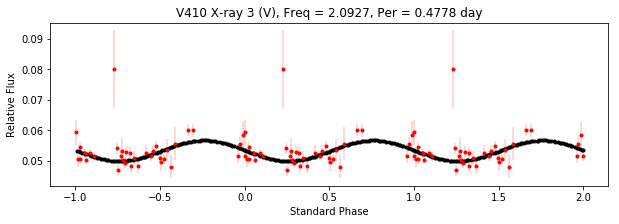

V410 X-ray 3 the period of 1.4714320446863902


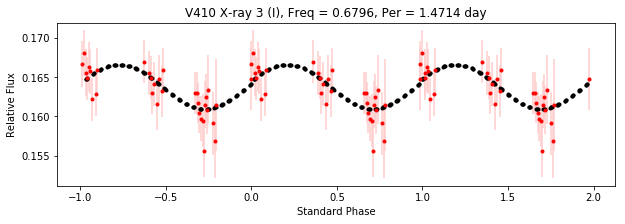

V410 X-ray 3 the period of 1.5482058486106989


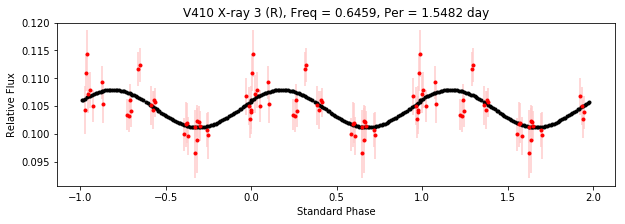

XZ Tau the period of 0.8878431372730883


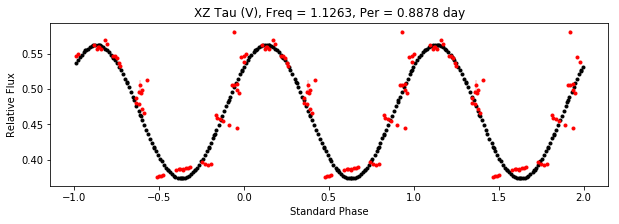

XZ Tau the period of 1.0728360711984113


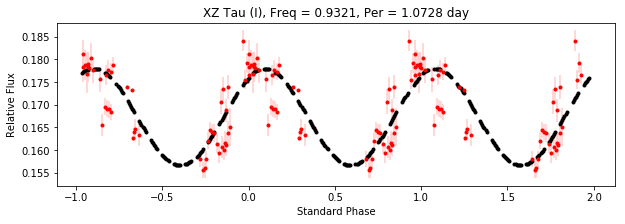

XZ Tau the period of 1.0730591867446257


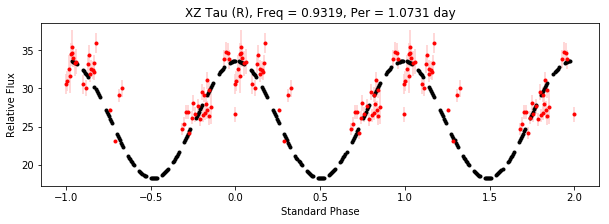

XZ Tau the period of 1.110893032405815


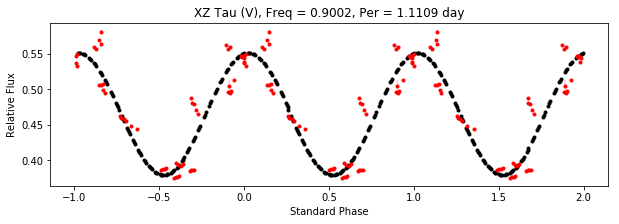

XZ Tau the period of 1.1065770334564744


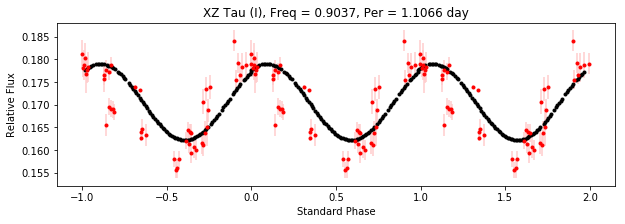

XZ Tau the period of 1.1068045127945594


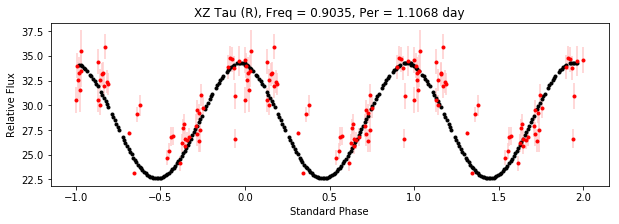

XZ Tau the period of 1.1469098277824288


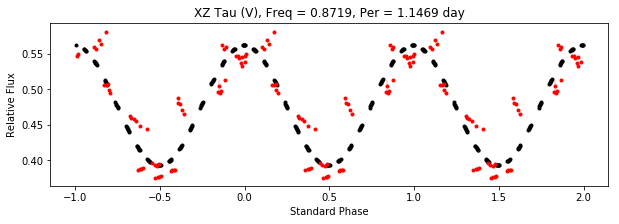

XZ Tau the period of 1.0410918371133286


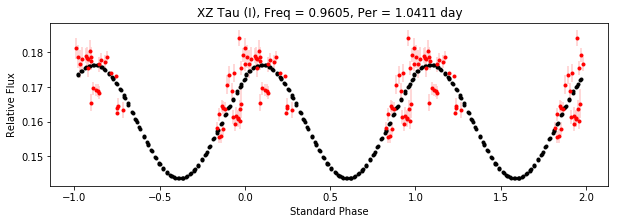

XZ Tau the period of 1.041310699397278


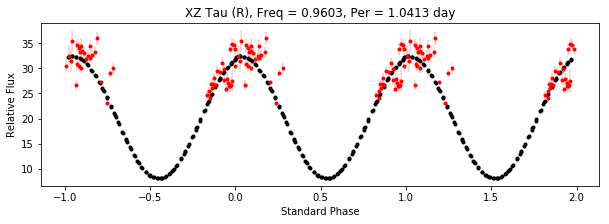

XZ Tau the period of 1.0770694576800928


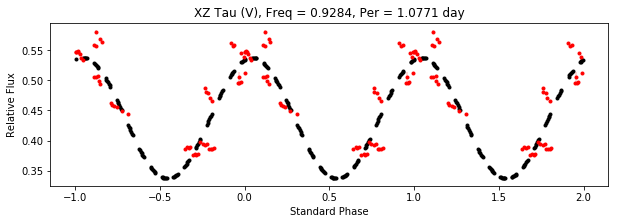

XZ Tau the period of 0.9069175500220567


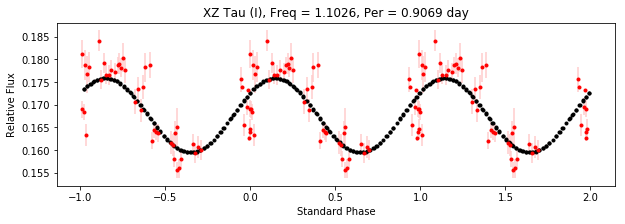

XZ Tau the period of 0.5268811168093974


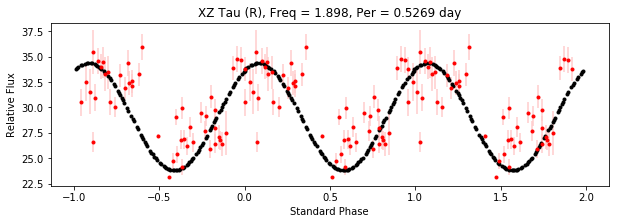

HL Tau the period of 1.110893032405815


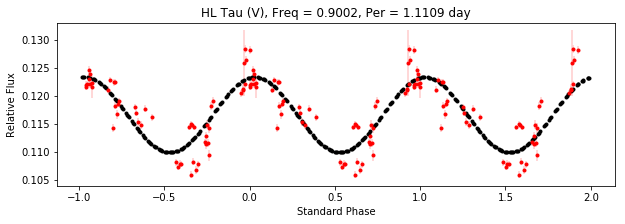

HL Tau the period of 0.26495477093707226


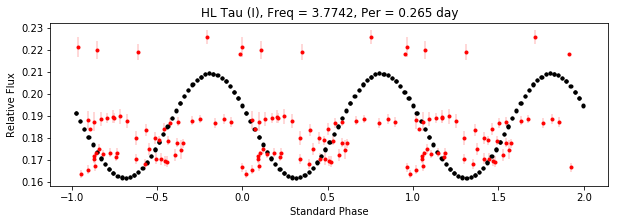

HL Tau the period of 1.041310699397278


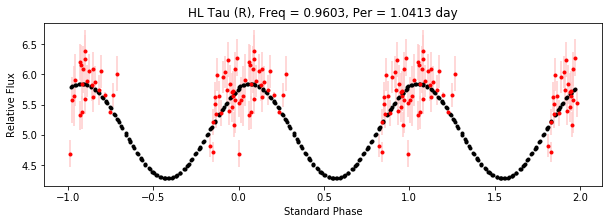

HL Tau the period of 0.9106999195679946


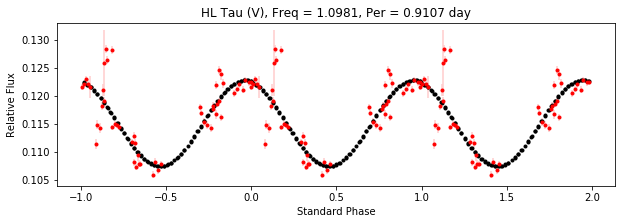

HL Tau the period of 0.28653155124893376


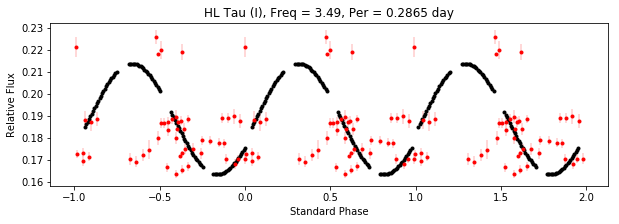

HL Tau the period of 1.0730591867446257


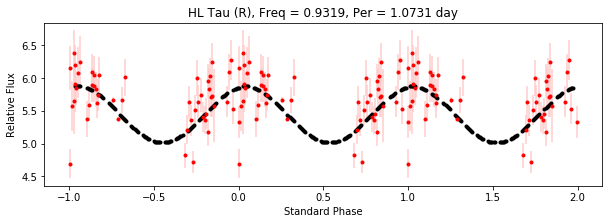

HL Tau the period of 1.1469098277824288


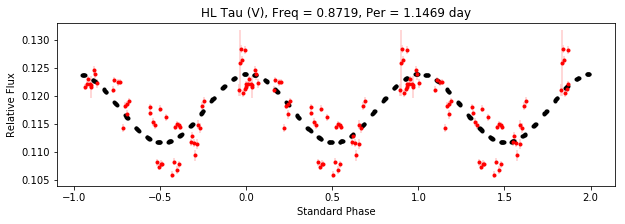

HL Tau the period of 0.2629744854586897


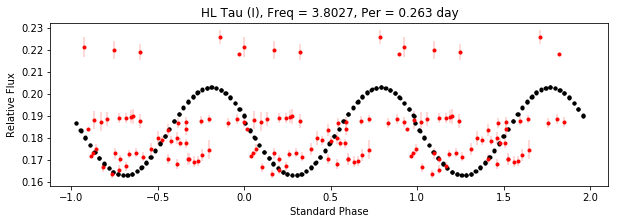

HL Tau the period of 0.5115645269932699


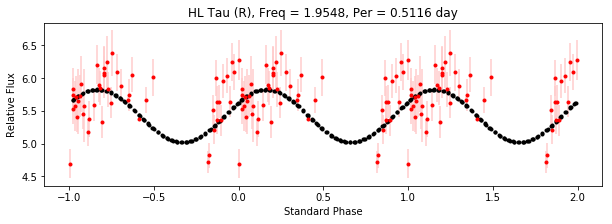

HL Tau the period of 1.0770694576800928


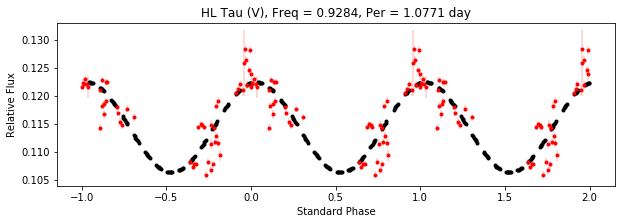

HL Tau the period of 0.35977862136892624


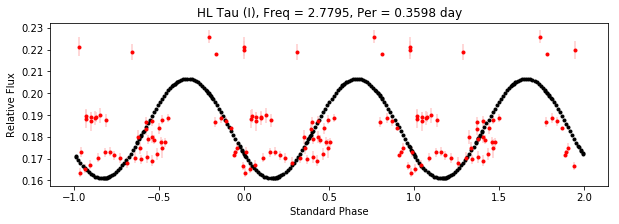

HL Tau the period of 0.2630443109639181


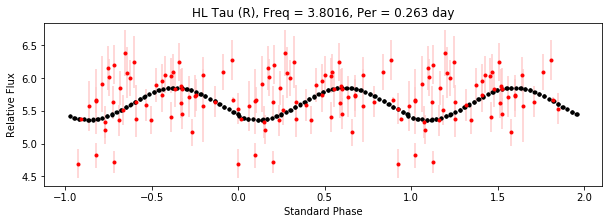

In [15]:
filters = ['V','I','R']
min_freq = 0.25
max_freq = 4
        
per_targ = ['FR Tau','FQ Tau','UX Tau A','UX Tau B','HH 30', 'V410 X-ray 6','V410 X-ray 3','XZ Tau','HL Tau'] 

for ind in range(0,len(per_targ)): 
    best_per = np.zeros([3,5]) #generating empty best period array
    #making that best period array (contains each band)
    for filt in range(0,len(filters)): #looping through each filter
        time_n = all_targ_data[per_targ[ind],filters[filt]][1] #time for each target
        starflux_n = all_targ_data[per_targ[ind],filters[filt]][0] #star flux with nans
        starfluxerr_n = all_targ_data_err[per_targ[ind],filters[filt]] #error with nans
        starflux = starflux_n[~np.isnan(starflux_n)] #starflux without nans
        starfluxerr = starfluxerr_n[~np.isnan(starfluxerr_n)] #starflux error without nans
        time = time_n[~np.isnan(starflux_n)] #time without nans
     
        f, p = LombScargle(time, starflux, starfluxerr).autopower(minimum_frequency = min_freq, maximum_frequency = max_freq) # default autopower settings
        
        # calculate the period, as inverse of frequency
        per = 1/f
        
        # make an array of the three columns and turn that into a dataframe:
        ls_output_arrays = np.c_[p, f, per]
        ls_output = pd.DataFrame(ls_output_arrays, columns=['Power', 'Frequency', 'Period'])
        
        # now sort the whole dataframe by the “Power” column and save the first 10 rows:
        best_per_df = ls_output.sort_values(by='Power', ascending=False)['Period']
        best_per[filt] = best_per_df[:5].values #saving the 10 strongest periods in this band
    #testing the best period
    for per in range(0,len(best_per[0])-1):
        for filt in range(0,len(filters)):
            test_per = best_per[filt][per] #looping through the V band periods
            print(per_targ[ind]+' the period of '+str(test_per)) #print common V band period
            #then model that period on all three bands
            time_n = all_targ_data[per_targ[ind],filters[filt]][1] #time for each target
            starflux_n = all_targ_data[per_targ[ind],filters[filt]][0] #star flux with nans
            starfluxerr_n = all_targ_data_err[per_targ[ind],filters[filt]] #error with nans
            starflux = starflux_n[~np.isnan(starflux_n)] #starflux without nans
            starfluxerr = starfluxerr_n[~np.isnan(starfluxerr_n)] #starflux error without nans
            time = time_n[~np.isnan(starflux_n)] #time without nans
                
            time_ep = time[2] #time epoch to test phase against CHANGE
            phase_data = ((time-time_ep)/test_per) #phase
            stnd_phase_data = phase_data%1 #normalized phase
                
            test_freq = 1/test_per
                
            time_model = np.linspace(np.min(time), np.max(time), 100) #a model of the time
            mag_model = LombScargle(time, starflux, starfluxerr).model(time_model, test_freq) #model of the best period
            phase_LS = ((time_model-time_ep)/test_per) #phase from the model
            stnd_phase_LS = phase_LS%1 #normalized phase from the model
            
            #making a new plot for periodigram
            fig, ax = plt.subplots(figsize=(10,3)) #setting up a new plot
            plt.plot(stnd_phase_LS, mag_model, 'k.') #plot the model normal phase
            plt.plot(stnd_phase_LS+-np.max(stnd_phase_LS), mag_model, 'k.') #as well as model +phase
            plt.plot(stnd_phase_LS+np.max(stnd_phase_LS), mag_model, 'k.') #and model -phase
                
            plt.errorbar(stnd_phase_data + -np.max(stnd_phase_data), starflux, starfluxerr, fmt='.', color='red', ecolor='#ffcccc') #-phase data
            plt.errorbar(stnd_phase_data + 0, starflux, starfluxerr, fmt='.', color='red', ecolor='#ffcccc') #normal phase data
            plt.errorbar(stnd_phase_data + np.max(stnd_phase_data), starflux, starfluxerr, fmt='.', color='red', ecolor='#ffcccc') #+phase data
                  
            plt.xlabel('Standard Phase')
            plt.ylabel('Relative Flux')
            plt.title(per_targ[ind]+' ('+filters[filt]+')'+', '+'Freq = '+str(round(test_freq,4))+', Per = '+str(round(test_per,4))+' day')
            plt.show()

In [7]:
data

,,Label,slice,Saturated,J.D.-2400000,JD_UTC,JD_SOBS,HJD_UTC,BJD_TDB,AIRMASS,...,Source_SNR_C8,Peak_C8,Mean_C8,Sky/Pixel_C8,FWHM_C8,Width_C8,X-Width_C8,Y-Width_C8,Angle_C8,Roundness_C8
0,1,c_1_13_R.fits,1,62999.00391,58131.71238,2458131.712,NaN,NaN,NaN,1.041,...,37.004590,395.975525,26.537233,70.082301,3.971860,6.266250,6.222415,6.310086,53.237894,0.997567
1,2,shifted_image1.fits,2,0.00000,58132.61565,2458132.616,NaN,NaN,NaN,1.112,...,5.217135,47.249149,2.137474,-0.092451,3.766934,4.656361,6.215078,3.097643,329.316656,-0.578371
2,3,shifted_image2.fits,3,0.00000,58133.58145,2458133.581,NaN,NaN,NaN,1.221,...,5.279865,55.172913,2.163685,-0.024048,3.738435,1.885272,1.514592,2.255952,318.033672,-11.830278
3,4,shifted_image3.fits,4,0.00000,58134.57669,2458134.577,NaN,NaN,NaN,1.230,...,7.566884,71.347794,3.131010,-0.622300,2.858071,5.883439,4.032055,7.734823,291.824743,0.373661
4,5,shifted_image4.fits,5,0.00000,58135.72454,2458135.725,NaN,NaN,NaN,1.072,...,7.931452,40.174252,3.275279,-0.638850,4.689530,7.033612,6.376722,7.690503,270.130433,0.965711
5,6,shifted_image5.fits,6,0.00000,58136.58521,2458136.585,NaN,NaN,NaN,1.173,...,6.201390,33.935078,2.550487,-0.793551,4.409338,6.106102,5.340795,6.871409,81.938251,0.934004
6,7,shifted_image6.fits,7,0.00000,58137.57971,2458137.580,NaN,NaN,NaN,1.183,...,9.043265,76.979958,3.748671,-2.705488,2.913891,6.321600,5.523002,7.120198,57.383290,0.647595
7,8,shifted_image7.fits,8,0.00000,58138.60529,2458138.605,NaN,NaN,NaN,1.097,...,7.655993,73.873528,3.156259,-0.572809,3.133841,4.433365,3.967522,4.899207,281.256309,-26.121613
8,9,shifted_image8.fits,9,64286.75781,58131.74392,2458131.744,NaN,NaN,NaN,1.087,...,54.552012,426.422760,26.813659,-3.654306,3.536680,5.489441,5.741842,5.237040,356.104884,0.991422
9,10,shifted_image9.fits,10,0.00000,58132.63155,2458132.632,NaN,NaN,NaN,1.077,...,7.675936,60.193459,3.146986,-0.578303,3.609491,5.282658,4.861531,5.703785,71.006264,0.959592


table should have targ name, is it variable, periodic?, amplitude, period
normalize bands for color based on median flux
vinyetting

In [3]:
from HDI_io import construct_astrometry

In [4]:
direct = os.getcwd()
image = glob.glob(direct+'/Data/'+'Coord_Fu*.fit*')

hdulist = fits.open(image[0])

hdr_wcs = hdulist[0].header

world = construct_astrometry(hdr_wcs)

In [45]:
im_dat = fits.getdata(image[0])
bkg_sigma = 5
nsigma = 5

daofind = DAOStarFinder(fwhm=4., threshold=nsigma*bkg_sigma)

sources = daofind(im_dat)
aprad = 8

xpos = np.array(sources['xcentroid'])
ypos = np.array(sources['ycentroid'])

taura,taudec = world.all_pix2world(xpos,ypos,0)
survey_csv = glob.glob(direct+'/Survey*.csv')
survey = pd.read_csv(survey_csv[0])


In [42]:
file = open('matched_sources.reg','w')
ind = 0
for star in range(0,len(survey)):
    s_ra = survey['RAJ2000'][star] #ra for survey star
    s_de = survey['DEJ2000'][star] #dec for survey star
    try:
        ra_ind = np.where(np.abs(taura-s_ra)<(15e-4))[0][0] #finding the index of the ra of the star in our survey (if it's within 5arcsec)
        de_ind = np.where(np.abs(taudec-s_de)<(15e-4))[0][0] #finding the index of the dec of the star in our survey (if it's within 5arcsec)
        if ra_ind == de_ind: #if the indexes match (the coordinates are for the same star)
            file.write('circle '+str(xpos[ra_ind])+' '+str(ypos[de_ind])+' '+str(int(aprad))+' # width=3 color=red\n')
    except:
        pass
    
file.close()

In [36]:
star = 1
s_ra = survey['RAJ2000'][star]
s_de = survey['DEJ2000'][star]
if np.where(np.abs(taura-s_ra)<(15e-4))[0][0] == np.where(np.abs(taudec-s_de)<(15e-4))[0][0]:
    

SyntaxError: unexpected EOF while parsing (<ipython-input-36-851a2d200043>, line 5)

In [46]:
survey_csv

['/Volumes/MirSD/Survey Data - USNOB_RI.csv']

In [35]:
star

1